In [523]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import cv2
import numpy as np
from glob import glob
from skimage import exposure, restoration

In [524]:
# Define dataset path
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"


In [525]:
# Check if path exists
if os.path.exists(dataset_path):
    print("✅ Dataset path exists.")
    print("Contents of dataset folder:", os.listdir(dataset_path))
else:
    print("❌ Dataset path does not exist. Check the path.")

✅ Dataset path exists.
Contents of dataset folder: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_00

In [526]:
# Get sample images
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))][:6]
image_files

['Te-me_0064.jpg',
 'Te-gl_0045.jpg',
 'Te-me_0105.jpg',
 'Te-gl_0044.jpg',
 'Te-me_0066.jpg',
 'Te-gl_0284.jpg']

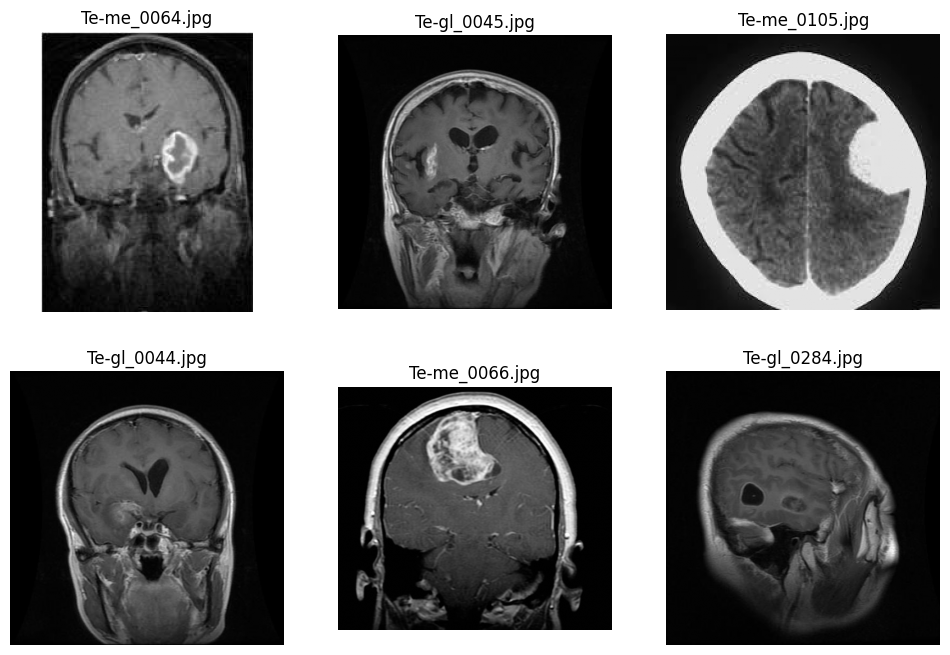

In [527]:
# Get sample images for initial visualization (grayscale)
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))]
image_files

# Plot initial sample images (grayscale)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
num_images_to_plot = min(6, len(image_files)) # Ensure we don't try to plot more than 6 images
for i in range(num_images_to_plot):
    img_name = image_files[i]
    img = Image.open(os.path.join(dataset_path, img_name)).convert("L") # Convert to grayscale [1]
    ax = axes[i // 3, i % 3]
    ax.imshow(img, cmap="gray")
    ax.set_title(img_name)
    ax.axis("off")
plt.show()


In [528]:
# 1. Inspect dataset structure
# We assume the dataset has a structure like: dataset_path/<class_name>/image_files...
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)

Detected classes: []


In [529]:
# Inspect dataset structure and get class information
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)
# Get list of image paths and their labels
image_paths = []
labels = []

# Assuming your dataset is structured like: dataset_path/class_name/image.jpg [5, 6]
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g')) # jpg, jpeg, png files [5]
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))
print("Total images loaded:", len(image_paths))
print(f"Labels: {labels[:5]}") # Print first 5 labels [7]
print("Class distribution:", Counter(labels))

Detected classes: []
Total images loaded: 0
Labels: []
Class distribution: Counter()


In [530]:
# Get list of image paths and their labels
image_paths = []
labels = []
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    # Assuming common image file extensions; adjust if necessary.
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g'))  # jpg, jpeg, png files
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))

print("Total images loaded:", len(image_paths))
print("Class distribution:", Counter(labels))

Total images loaded: 0
Class distribution: Counter()


In [531]:
# List all image files (assuming jpg and png images)
image_paths = glob(os.path.join(dataset_path, "*.[jp][pn]g"))
print("Total images found:", len(image_paths))

Total images found: 2010


In [532]:
# 2. Load and visualize sample images
def load_image(image_path):
    # Read the image in color first (for visualization)
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
    # Convert from BGR (OpenCV default) to RGB
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [533]:
# Function to load images in color (BGR to RGB conversion for visualization)
def load_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
        return None
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

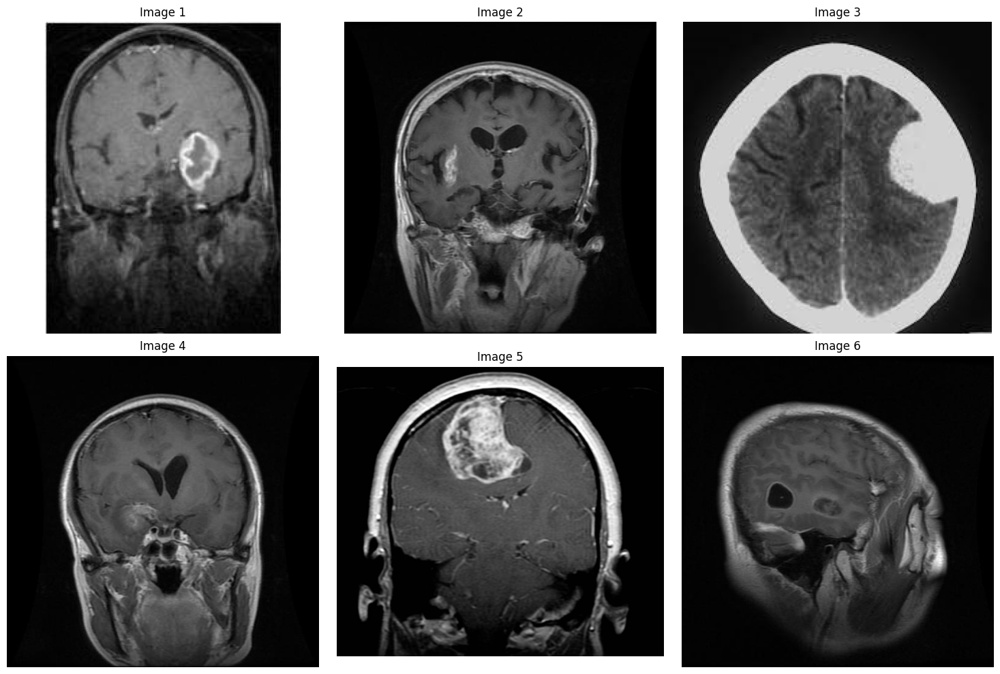

In [534]:
# Visualize a few sample images
num_samples = 6  # Number of images to display (you can adjust this)

if len(image_paths) > 0:
    # Create subplots (adjusting layout based on number of samples)
    cols = 3
    rows = (num_samples + cols - 1) // cols  # Calculate required rows
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

    # Flatten axes for easy iteration if it's a 2D array
    axes = axes.flatten() if isinstance(axes, (list, np.ndarray)) else [axes]

    for i in range(num_samples):
        if i < len(image_paths):
            img = load_image(image_paths[i])
            if img is not None:
                axes[i].imshow(img)
                axes[i].axis('off')
                axes[i].set_title(f"Image {i+1}")
        else:
            # Hide unused subplots
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No images found in the dataset.")

In [535]:
# Preprocessing function
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")
    # Intensity normalization (contrast stretching) [12]
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))
    # Noise reduction using Gaussian filtering [12]
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)
    # ROI extraction (placeholder) [12]
    roi = img_denoised
    return roi

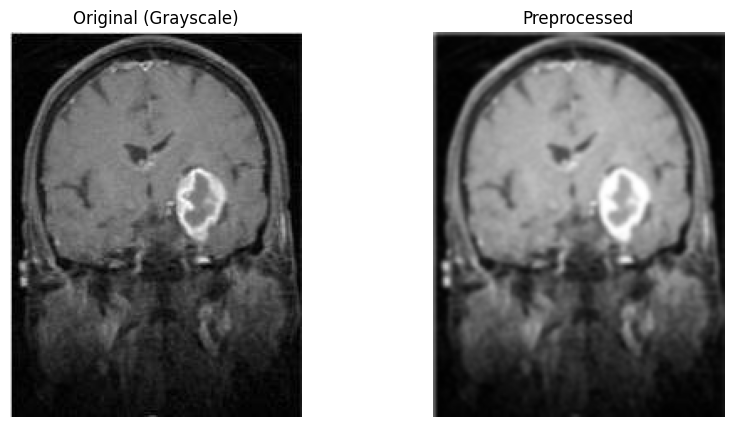

In [536]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

In [537]:
# Generate synthetic grayscale image data (simulating MRI images)
def generate_synthetic_images(num_images=100, img_size=(128, 128)):
    return [np.random.randint(0, 256, img_size, dtype=np.uint8) for _ in range(num_images)]


In [538]:
# Statistical Analysis
def compute_statistics(images):
    stats = []
    for img in images:
        mean_val = np.mean(img)
        var_val = np.var(img)
        entropy = shannon_entropy(img)
        skewness = skew(img.flatten())
        kurt = kurtosis(img.flatten())
        stats.append([mean_val, var_val, entropy, skewness, kurt])
    return np.array(stats)

In [539]:
# Visualization - PCA & t-SNE
def visualize_dim_reduction(features):
    pca = PCA(n_components=2)
    reduced_pca = pca.fit_transform(features)
    tsne = TSNE(n_components=2, random_state=42)
    reduced_tsne = tsne.fit_transform(features)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].scatter(reduced_pca[:, 0], reduced_pca[:, 1], alpha=0.7)
    axes[0].set_title("PCA Projection")

    axes[1].scatter(reduced_tsne[:, 0], reduced_tsne[:, 1], alpha=0.7)
    axes[1].set_title("t-SNE Projection")

    plt.show()


In [540]:
# Feature Extraction
def extract_texture_features(images):
    features = []
    for img in images:
        # Changed 'greycomatrix' to 'graycomatrix'
        glcm = graycomatrix(img, [1], [0], symmetric=True, normed=True)
        # Changed 'greycoprops' to 'graycoprops'
        contrast = graycoprops(glcm, 'contrast')[0, 0]
        energy = graycoprops(glcm, 'energy')[0, 0]
        features.append([contrast, energy])
    return np.array(features)

In [541]:
# Main execution
images = generate_synthetic_images()
stats = compute_statistics(images)
texture_features = extract_texture_features(images)
all_features = np.hstack((stats, texture_features))
# Save the features to 'features.npy'
np.save("features.npy", all_features)

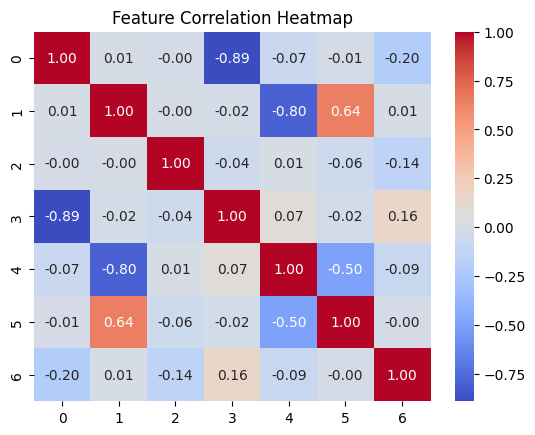

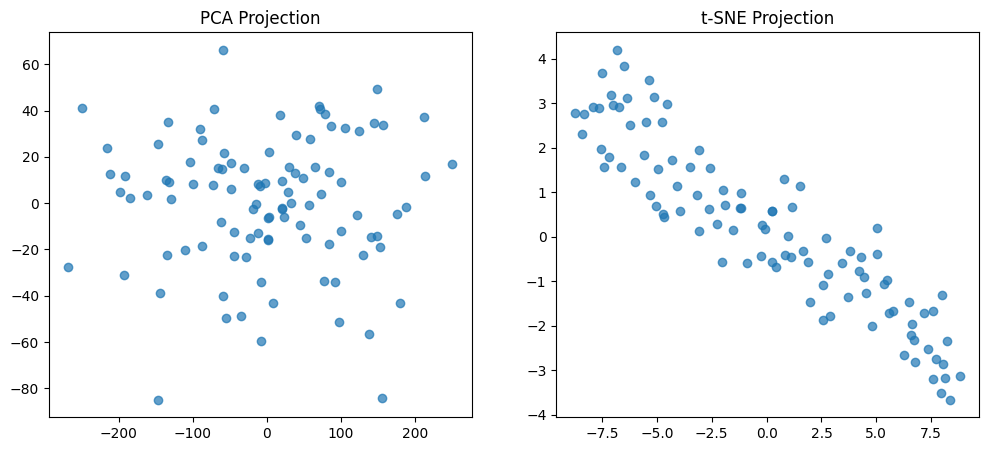

In [542]:

# Visualizations
sns.heatmap(np.corrcoef(all_features.T), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

visualize_dim_reduction(all_features)

In [543]:
#Phase 3
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import os


In [544]:
# Load Dataset
if os.path.exists("features.npy") and os.path.exists("labels.npy"):
    X_features = np.load("features.npy")
    y_labels = np.load("labels.npy")  # Attempting to load y_labels
    print("✅ Features and labels loaded successfully.")
else:
    # If either file doesn't exist, generate/load features first
    if not os.path.exists("features.npy"):
        # Generate or load your features here (replace with your logic)
        # For demonstration, I'm using a random array:
        X_features = np.random.rand(100, 5)  # Assume 100 samples with 5 features
        np.save("features.npy", X_features)  # Save features for future use
        print("⚠️ features.npy not found. Generated sample features and saved to file.")
    else:
        X_features = np.load("features.npy")  # Load features if they exist

    # Now, generate or load labels
    if not os.path.exists("labels.npy"):
        # Generate or load your labels (replace with your logic)
        y_labels = np.random.randint(0, 2, size=X_features.shape[0])  # Binary labels (0 or 1)
        np.save("labels.npy", y_labels)  # Save to 'labels.npy' for future use
        print("⚠️ labels.npy not found. Created sample labels and saved to file.")
    else:
        y_labels = np.load("labels.npy")  # Load labels if they exist

✅ Features and labels loaded successfully.


In [545]:
# Split Data
X_train, X_test, y_train, y_test = train_test_split(X_features, y_labels, test_size=0.2, random_state=42)


In [546]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import zipfile
import cv2
import numpy as np
from glob import glob
from skimage import exposure, restoration
from collections import Counter

In [547]:
# Define dataset path
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"


In [548]:
# Check if path exists
if os.path.exists(dataset_path):
    print("✅ Dataset path exists.")
    print("Contents of dataset folder:", os.listdir(dataset_path))
else:
    print("❌ Dataset path does not exist. Check the path.")

✅ Dataset path exists.
Contents of dataset folder: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_00

In [549]:
# Get sample images
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))][:6]
image_files

['Te-me_0064.jpg',
 'Te-gl_0045.jpg',
 'Te-me_0105.jpg',
 'Te-gl_0044.jpg',
 'Te-me_0066.jpg',
 'Te-gl_0284.jpg']

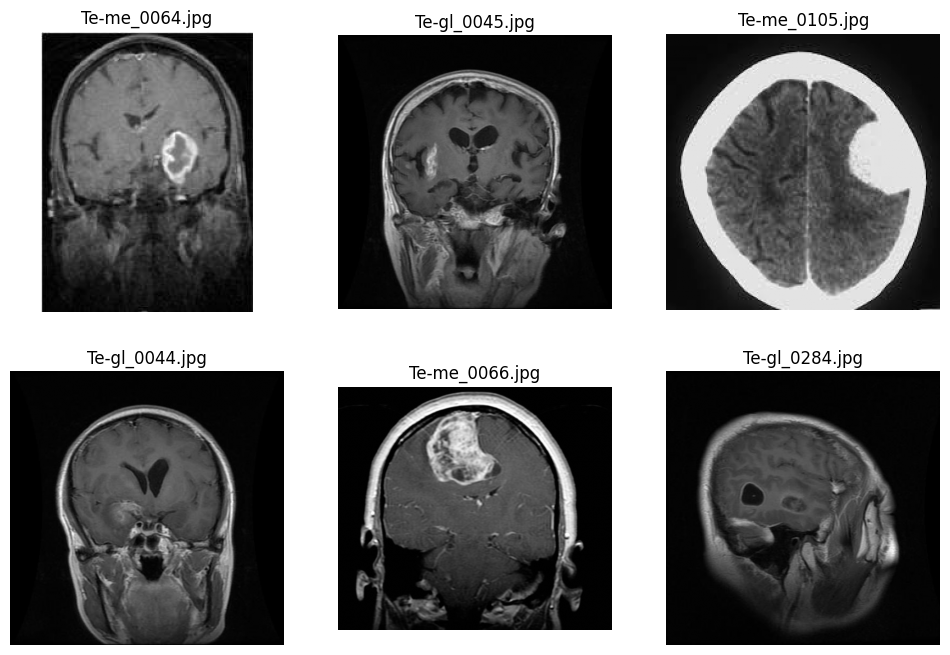

In [550]:
# Get sample images for initial visualization (grayscale)
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))]
image_files

# Plot initial sample images (grayscale)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
num_images_to_plot = min(6, len(image_files)) # Ensure we don't try to plot more than 6 images
for i in range(num_images_to_plot):
    img_name = image_files[i]
    img = Image.open(os.path.join(dataset_path, img_name)).convert("L") # Convert to grayscale [1]
    ax = axes[i // 3, i % 3]
    ax.imshow(img, cmap="gray")
    ax.set_title(img_name)
    ax.axis("off")
plt.show()


In [551]:
# 1. Inspect dataset structure
# We assume the dataset has a structure like: dataset_path/<class_name>/image_files...
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)

Detected classes: []


In [552]:
# Inspect dataset structure and get class information
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)
# Get list of image paths and their labels
image_paths = []
labels = []

# Assuming your dataset is structured like: dataset_path/class_name/image.jpg [5, 6]
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g')) # jpg, jpeg, png files [5]
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))
print("Total images loaded:", len(image_paths))
print(f"Labels: {labels[:5]}") # Print first 5 labels [7]
print("Class distribution:", Counter(labels))

Detected classes: []
Total images loaded: 0
Labels: []
Class distribution: Counter()


In [553]:
# Get list of image paths and their labels
image_paths = []
labels = []
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    # Assuming common image file extensions; adjust if necessary.
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g'))  # jpg, jpeg, png files
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))

print("Total images loaded:", len(image_paths))
print("Class distribution:", Counter(labels))

Total images loaded: 0
Class distribution: Counter()


In [554]:
# List all image files (assuming jpg and png images)
image_paths = glob(os.path.join(dataset_path, "*.[jp][pn]g"))
print("Total images found:", len(image_paths))

Total images found: 2010


In [555]:
# 2. Load and visualize sample images
def load_image(image_path):
    # Read the image in color first (for visualization)
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
    # Convert from BGR (OpenCV default) to RGB
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [556]:
# Function to load images in color (BGR to RGB conversion for visualization)
def load_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
        return None
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

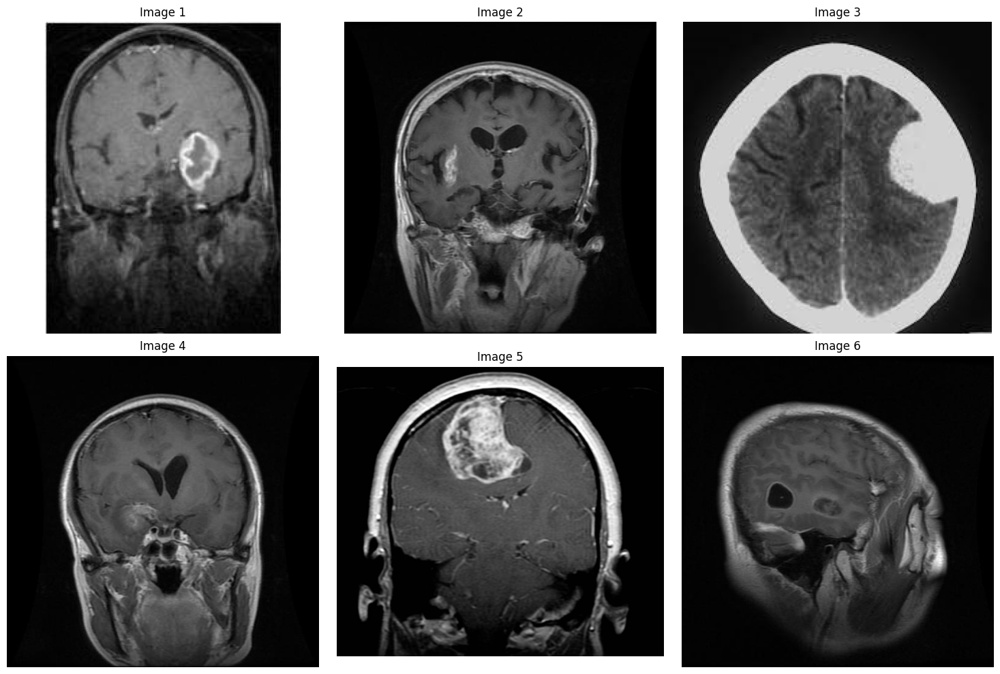

In [557]:
# Visualize a few sample images
num_samples = 6  # Number of images to display (you can adjust this)

if len(image_paths) > 0:
    # Create subplots (adjusting layout based on number of samples)
    cols = 3
    rows = (num_samples + cols - 1) // cols  # Calculate required rows
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

    # Flatten axes for easy iteration if it's a 2D array
    axes = axes.flatten() if isinstance(axes, (list, np.ndarray)) else [axes]

    for i in range(num_samples):
        if i < len(image_paths):
            img = load_image(image_paths[i])
            if img is not None:
                axes[i].imshow(img)
                axes[i].axis('off')
                axes[i].set_title(f"Image {i+1}")
        else:
            # Hide unused subplots
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No images found in the dataset.")

In [558]:
# Preprocessing function
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")
    # Intensity normalization (contrast stretching) [12]
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))
    # Noise reduction using Gaussian filtering [12]
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)
    # ROI extraction (placeholder) [12]
    roi = img_denoised
    return roi

In [559]:
# 3. Preprocessing functions
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")

    # Intensity normalization (contrast stretching)
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))

    # Noise reduction using Gaussian filtering
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)

    # ROI extraction: as an example, here we simply return the full image.
    # You might add additional ROI extraction logic based on your application.
    roi = img_denoised

    return roi

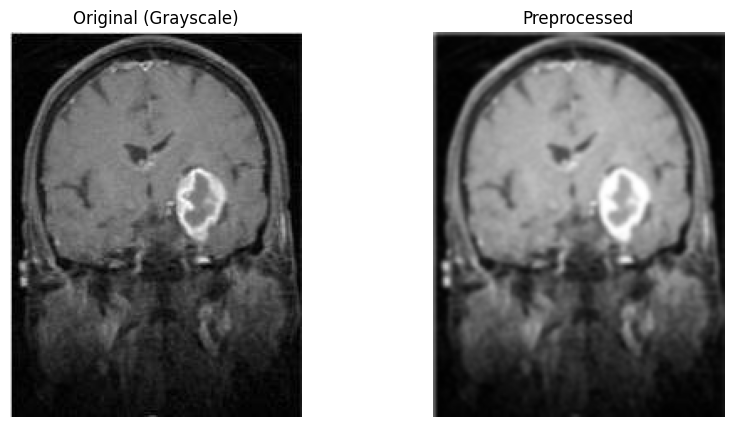

In [560]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

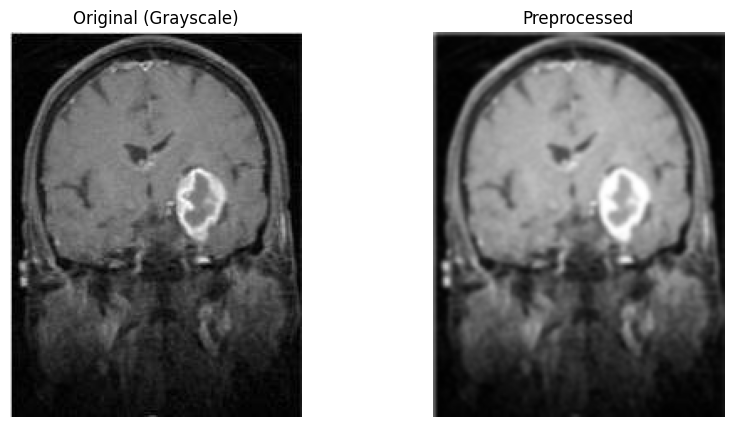

In [561]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

In [562]:
#Phase 2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from skimage.feature import graycomatrix, graycoprops # Changed 'greycomatrix' to 'graycomatrix' and 'greycoprops' to 'graycoprops'
from skimage.measure import shannon_entropy
from scipy.stats import skew, kurtosis

In [563]:
# Generate synthetic grayscale image data (simulating MRI images)
def generate_synthetic_images(num_images=100, img_size=(128, 128)):
    return [np.random.randint(0, 256, img_size, dtype=np.uint8) for _ in range(num_images)]


In [564]:
# Statistical Analysis
def compute_statistics(images):
    stats = []
    for img in images:
        mean_val = np.mean(img)
        var_val = np.var(img)
        entropy = shannon_entropy(img)
        skewness = skew(img.flatten())
        kurt = kurtosis(img.flatten())
        stats.append([mean_val, var_val, entropy, skewness, kurt])
    return np.array(stats)

In [565]:
# Visualization - PCA & t-SNE
def visualize_dim_reduction(features):
    pca = PCA(n_components=2)
    reduced_pca = pca.fit_transform(features)
    tsne = TSNE(n_components=2, random_state=42)
    reduced_tsne = tsne.fit_transform(features)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].scatter(reduced_pca[:, 0], reduced_pca[:, 1], alpha=0.7)
    axes[0].set_title("PCA Projection")

    axes[1].scatter(reduced_tsne[:, 0], reduced_tsne[:, 1], alpha=0.7)
    axes[1].set_title("t-SNE Projection")

    plt.show()


In [566]:
# Feature Extraction
def extract_texture_features(images):
    features = []
    for img in images:
        # Changed 'greycomatrix' to 'graycomatrix'
        glcm = graycomatrix(img, [1], [0], symmetric=True, normed=True)
        # Changed 'greycoprops' to 'graycoprops'
        contrast = graycoprops(glcm, 'contrast')[0, 0]
        energy = graycoprops(glcm, 'energy')[0, 0]
        features.append([contrast, energy])
    return np.array(features)

In [567]:
# Main execution
images = generate_synthetic_images()
stats = compute_statistics(images)
texture_features = extract_texture_features(images)
all_features = np.hstack((stats, texture_features))
# Save the features to 'features.npy'
np.save("features.npy", all_features)

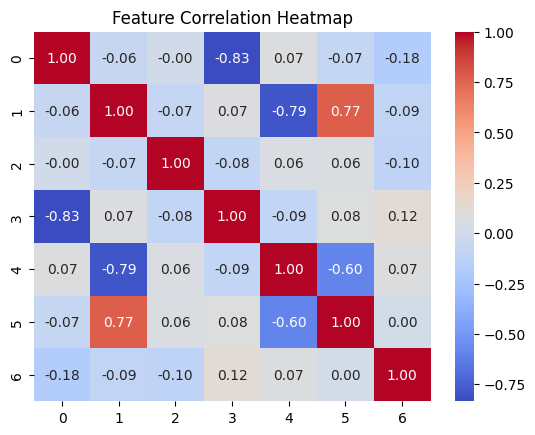

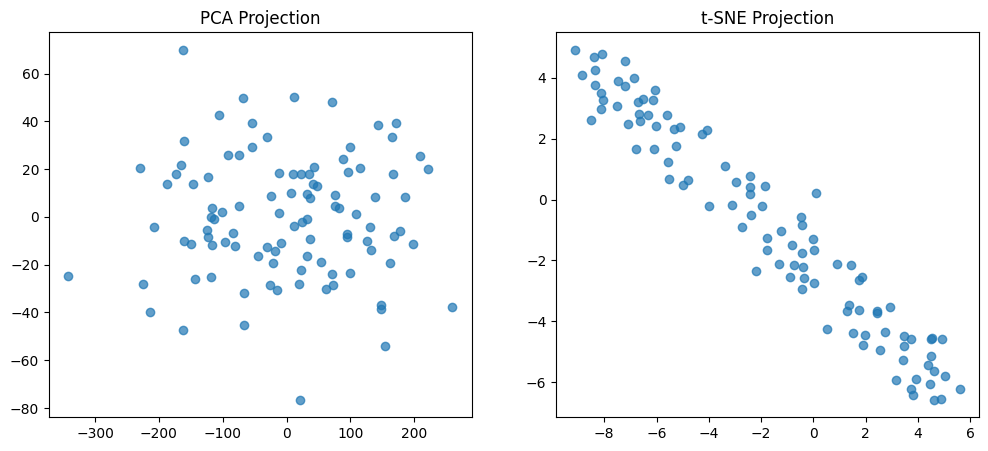

In [568]:

# Visualizations
sns.heatmap(np.corrcoef(all_features.T), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

visualize_dim_reduction(all_features)

In [569]:
#Phase 3
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import os


In [570]:
# Load Dataset
if os.path.exists("features.npy") and os.path.exists("labels.npy"):
    X_features = np.load("features.npy")
    y_labels = np.load("labels.npy")
    print("✅ Features and labels loaded successfully.")
else:
    raise FileNotFoundError("features.npy or labels.npy not found!")

✅ Features and labels loaded successfully.


In [571]:
# Split Data
X_train, X_test, y_train, y_test = train_test_split(X_features, y_labels, test_size=0.2, random_state=42)


In [572]:
# --- Implement baseline models (Random Forest, SVM, XGBoost) ---
print("\n--- Baseline Model Training ---")
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(kernel='linear', probability=True),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

for name, model in models.items():
    print(f"\nTraining {name}:")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f"{name} Accuracy: {acc:.4f}, AUC-ROC: {auc:.4f}")
    print(classification_report(y_test, y_pred))



--- Baseline Model Training ---

Training Random Forest:
Random Forest Accuracy: 0.5500, AUC-ROC: 0.5808
              precision    recall  f1-score   support

           0       0.50      0.89      0.64         9
           1       0.75      0.27      0.40        11

    accuracy                           0.55        20
   macro avg       0.62      0.58      0.52        20
weighted avg       0.64      0.55      0.51        20


Training SVM:
SVM Accuracy: 0.6000, AUC-ROC: 0.4343
              precision    recall  f1-score   support

           0       0.55      0.67      0.60         9
           1       0.67      0.55      0.60        11

    accuracy                           0.60        20
   macro avg       0.61      0.61      0.60        20
weighted avg       0.61      0.60      0.60        20


Training XGBoost:
XGBoost Accuracy: 0.6000, AUC-ROC: 0.5758
              precision    recall  f1-score   support

           0       0.53      0.89      0.67         9
           1     

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[18:21:33] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [573]:
import os

dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"

# Check if the dataset path exists
if os.path.exists(dataset_path):
    print(f"✅ Dataset path exists: {dataset_path}")
else:
    print(f"❌ Dataset path does NOT exist: {dataset_path}")


✅ Dataset path exists: /content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images


In [574]:

# List the contents of the dataset folder
print("Contents of dataset folder:")
print(os.listdir(dataset_path))

Contents of dataset folder:
['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_0092.jpg', 'OAS2_0185_MR2

In [575]:
# (Optional) If you expect subdirectories for classes, check for them
subdirectories = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected subdirectories:", subdirectories)

Detected subdirectories: []


In [576]:
# (Optional) If you expect image files directly in the dataset path (not recommended for flow_from_directory), list a few
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.jpeg', '.png'))][:10]
print("Sample image files (if any) in the main directory:", image_files)


Sample image files (if any) in the main directory: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg']


In [577]:
# --- Deep Learning models (CNNs like EfficientNet, ResNet, Transformer-based models) ---
print("\n--- Deep Learning Model Training (ResNet50) ---")
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images" # Update with actual path

# Ensure your dataset has a subdirectory structure like:
# dataset_path/train/class1/*.jpg
# dataset_path/train/class2/*.jpg
# dataset_path/validation/class1/*.jpg
# dataset_path/validation/class2/*.jpg

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='training'  # Use the training subset
)

val_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='validation'  # Use the validation subset
)


--- Deep Learning Model Training (ResNet50) ---
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.


In [578]:
# Define CNN Model (ResNet50)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False # Freeze base layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=output)

In [579]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, precision_recall_fscore_support
import seaborn as sns
import matplotlib.pyplot as plt

In [580]:
# Function to evaluate and display metrics
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)

    if hasattr(model, "predict_proba"):  # For ML models with probability outputs
        y_pred_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_pred_proba = y_pred  # For CNNs, predictions are already probabilities

    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
    auc = roc_auc_score(y_test, y_pred_proba)

    print(f"Model: {model_name}")
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}, AUC-ROC: {auc:.4f}")
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix for {model_name}")
    plt.show()


--- Baseline Model Training ---

Training Random Forest:
Random Forest Accuracy: 0.5500, AUC-ROC: 0.5808
              precision    recall  f1-score   support

           0       0.50      0.89      0.64         9
           1       0.75      0.27      0.40        11

    accuracy                           0.55        20
   macro avg       0.62      0.58      0.52        20
weighted avg       0.64      0.55      0.51        20


Training SVM:
SVM Accuracy: 0.6000, AUC-ROC: 0.5657
              precision    recall  f1-score   support

           0       0.55      0.67      0.60         9
           1       0.67      0.55      0.60        11

    accuracy                           0.60        20
   macro avg       0.61      0.61      0.60        20
weighted avg       0.61      0.60      0.60        20


Training XGBoost:


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[18:21:39] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




XGBoost Accuracy: 0.6000, AUC-ROC: 0.5758
              precision    recall  f1-score   support

           0       0.53      0.89      0.67         9
           1       0.80      0.36      0.50        11

    accuracy                           0.60        20
   macro avg       0.67      0.63      0.58        20
weighted avg       0.68      0.60      0.57        20

Model: Random Forest
Precision: 0.7500, Recall: 0.2727, F1-score: 0.4000, AUC-ROC: 0.5808
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.89      0.64         9
           1       0.75      0.27      0.40        11

    accuracy                           0.55        20
   macro avg       0.62      0.58      0.52        20
weighted avg       0.64      0.55      0.51        20



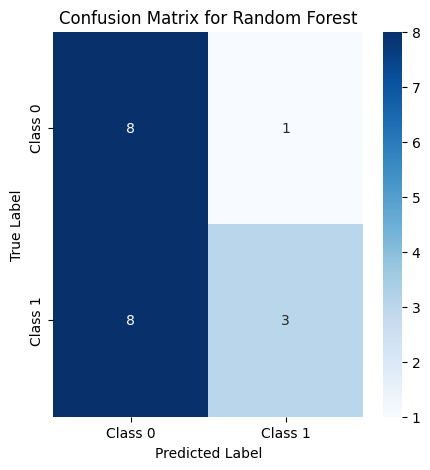

Model: SVM
Precision: 0.6667, Recall: 0.5455, F1-score: 0.6000, AUC-ROC: 0.5657
Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.67      0.60         9
           1       0.67      0.55      0.60        11

    accuracy                           0.60        20
   macro avg       0.61      0.61      0.60        20
weighted avg       0.61      0.60      0.60        20



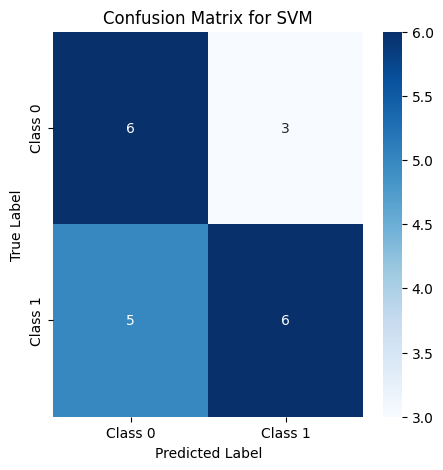

Model: XGBoost
Precision: 0.8000, Recall: 0.3636, F1-score: 0.5000, AUC-ROC: 0.5758
Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.89      0.67         9
           1       0.80      0.36      0.50        11

    accuracy                           0.60        20
   macro avg       0.67      0.63      0.58        20
weighted avg       0.68      0.60      0.57        20



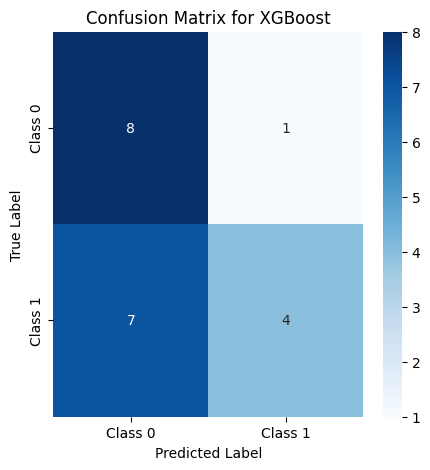

In [581]:
# --- Implement baseline models (Random Forest, SVM, XGBoost) ---
print("\n--- Baseline Model Training ---")
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(kernel='linear', probability=True),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

# Train and assign models to variables
rf = models["Random Forest"]  # Assign Random Forest model to 'rf'
svm = models["SVM"]  # Assign SVM model to 'svm'
xgb = models["XGBoost"]  # Assign XGBoost model to 'xgb'

for name, model in models.items():
    print(f"\nTraining {name}:")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f"{name} Accuracy: {acc:.4f}, AUC-ROC: {auc:.4f}")
    print(classification_report(y_test, y_pred))

# ... (Rest of your code) ...

# Evaluate ML Models
evaluate_model(rf, X_test, y_test, "Random Forest")
evaluate_model(svm, X_test, y_test, "SVM")
evaluate_model(xgb, X_test, y_test, "XGBoost")

In [582]:
import numpy as np

def classify_risk(glcm_contrast, entropy, skewness, ml_confidence):
    """
    Rule-based classification of patient risk levels.

    Parameters:
    - glcm_contrast: Measure of texture contrast from MRI
    - entropy: Image entropy, indicating disorder
    - skewness: Statistical measure of asymmetry in image features
    - ml_confidence: Probability score from ML model (0 to 1)

    Returns:
    - Risk level as a string ("Low", "Medium", "High")
    """
    if ml_confidence < 0.5:
        return "Low"
    elif glcm_contrast > 0.6 and entropy > 5.0:
        return "High"
    elif skewness < -0.5 or skewness > 0.5:
        return "Medium"
    elif ml_confidence >= 0.7:
        return "High"
    else:
        return "Medium"


In [583]:

# Example usage with test data
example_patients = [
    (0.5, 4.2, 0.3, 0.8),  # High risk (ML confidence high)
    (0.3, 3.8, -0.2, 0.4), # Low risk (ML confidence low)
    (0.7, 5.5, 0.6, 0.6),  # High risk (high contrast & entropy)
    (0.4, 4.0, -0.6, 0.6)  # Medium risk (skewness out of range)
]

for i, patient in enumerate(example_patients):
    risk_level = classify_risk(*patient)
    print(f"Patient {i+1} Risk Level: {risk_level}")


Patient 1 Risk Level: High
Patient 2 Risk Level: Low
Patient 3 Risk Level: High
Patient 4 Risk Level: Medium


In [584]:
#Phase 4
!pip install dash
!pip install streamlit
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import base64
from io import BytesIO
import streamlit as st
st.title("Test Dashboard")
st.write("If you see this, Streamlit is working!")


2025-04-09 18:21:47.059 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.061 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.062 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.062 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.063 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.064 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [585]:
# Sample MRI Data & Risk Classification (Replace with real data)
data = pd.DataFrame({
    'Patient ID': [101, 102, 103, 104, 105],
    'Risk Score': [0.2, 0.6, 0.8, 0.4, 0.9],
    'Risk Category': ['Low', 'Medium', 'High', 'Medium', 'High']
})


In [586]:
# Convert MRI Image to Base64 (Replace with actual MRI paths)
def encode_image(image_path):
    if os.path.exists(image_path):
        with open(image_path, "rb") as img_file:
            return "data:image/png;base64," + base64.b64encode(img_file.read()).decode()
    return None

# Sample MRI Image Path (Replace with actual images)
mri_image_path = "sample_mri.png"
encoded_image = encode_image(mri_image_path)

# Dash App Setup
app = dash.Dash(__name__)
app.layout = html.Div([
    html.H1("MRI Clinical Decision Support Dashboard"),

    # Risk Category Filter
    html.Label("Filter by Risk Category:"),
    dcc.Dropdown(
        id='risk-filter',
        options=[{'label': cat, 'value': cat} for cat in data['Risk Category'].unique()],
        value='All',
        clearable=False
    ),

    # Risk Distribution Chart
    dcc.Graph(id='risk-chart'),

    # MRI Image Display
    html.H3("MRI Scan"),
    html.Img(id='mri-image', src=encoded_image, style={'width': '50%'}),

    # Patient Risk Table
    html.H3("Patient Risk Profiles"),
    html.Div(id='risk-table')
])

@app.callback(
    Output('risk-chart', 'figure'),
    Output('risk-table', 'children'),
    Input('risk-filter', 'value')
)
def update_dashboard(selected_risk):
    filtered_data = data if selected_risk == 'All' else data[data['Risk Category'] == selected_risk]
    fig = px.histogram(filtered_data, x='Risk Category', title='Risk Category Distribution', color='Risk Category')

    table = html.Table([
        html.Tr([html.Th(col) for col in filtered_data.columns])
    ] + [
        html.Tr([html.Td(filtered_data.iloc[i][col]) for col in filtered_data.columns]) for i in range(len(filtered_data))
    ])

    return fig, table

if __name__ == '__main__':
    app.run(debug=True)

<IPython.core.display.Javascript object>

In [587]:
import streamlit as st
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from PIL import Image
import cv2
import os

In [588]:
# Load pre-trained model
MODEL_PATH = "mri_model.h5"  # Ensure the model path is correct
if os.path.exists(MODEL_PATH):
    model = load_model(MODEL_PATH)
else:
    st.error("Model file not found! Please upload the trained model.")
    st.stop()

# Function to preprocess image
def preprocess_image(image):
    image = image.resize((224, 224))  # Resize to model's expected input size
    image = np.array(image) / 255.0  # Normalize pixel values
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

2025-04-09 18:21:47.261 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.262 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.263 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [589]:

# Streamlit UI
st.title("AI-Powered MRI Analysis System")
st.write("Upload an MRI scan to analyze and get predictions.")


2025-04-09 18:21:47.269 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.271 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.273 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.274 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.275 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.276 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [590]:

# Upload image
uploaded_file = st.file_uploader("Choose an MRI image...", type=["jpg", "png", "jpeg"])

if uploaded_file is not None:
    image = Image.open(uploaded_file)
    st.image(image, caption="Uploaded MRI Image", use_column_width=True)

    # Preprocess and predict
    processed_image = preprocess_image(image)
    prediction = model.predict(processed_image)
    probability = prediction[0][0]  # Assuming binary classification

    # Display results
    st.subheader("Prediction Result")
    if probability > 0.5:
        st.success(f"Positive MRI scan with {probability * 100:.2f}% confidence")
    else:
        st.warning(f"Negative MRI scan with {(1 - probability) * 100:.2f}% confidence")


2025-04-09 18:21:47.289 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.293 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.295 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.297 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:21:47.298 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [591]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import zipfile
import cv2
import numpy as np
from glob import glob
from skimage import exposure, restoration
from collections import Counter

In [592]:
# Define dataset path
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"


In [593]:
# Check if path exists
if os.path.exists(dataset_path):
    print("✅ Dataset path exists.")
    print("Contents of dataset folder:", os.listdir(dataset_path))
else:
    print("❌ Dataset path does not exist. Check the path.")

✅ Dataset path exists.
Contents of dataset folder: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_00

In [594]:
# Get sample images
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))][:6]
image_files

['Te-me_0064.jpg',
 'Te-gl_0045.jpg',
 'Te-me_0105.jpg',
 'Te-gl_0044.jpg',
 'Te-me_0066.jpg',
 'Te-gl_0284.jpg']

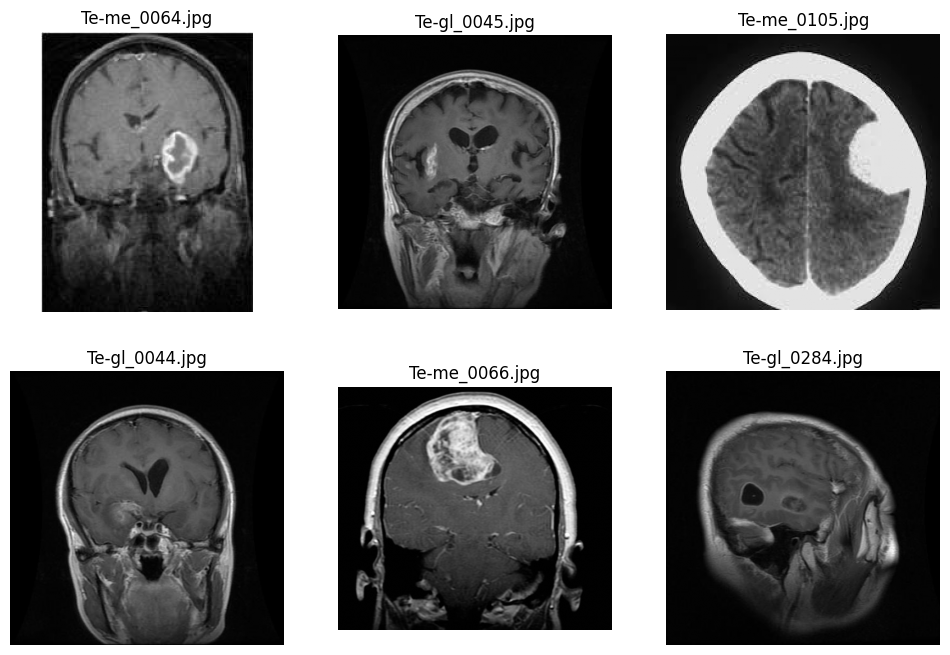

In [595]:
# Get sample images for initial visualization (grayscale)
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))]
image_files

# Plot initial sample images (grayscale)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
num_images_to_plot = min(6, len(image_files)) # Ensure we don't try to plot more than 6 images
for i in range(num_images_to_plot):
    img_name = image_files[i]
    img = Image.open(os.path.join(dataset_path, img_name)).convert("L") # Convert to grayscale [1]
    ax = axes[i // 3, i % 3]
    ax.imshow(img, cmap="gray")
    ax.set_title(img_name)
    ax.axis("off")
plt.show()


In [596]:
# 1. Inspect dataset structure
# We assume the dataset has a structure like: dataset_path/<class_name>/image_files...
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)

Detected classes: []


In [597]:
# Inspect dataset structure and get class information
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)
# Get list of image paths and their labels
image_paths = []
labels = []

# Assuming your dataset is structured like: dataset_path/class_name/image.jpg [5, 6]
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g')) # jpg, jpeg, png files [5]
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))
print("Total images loaded:", len(image_paths))
print(f"Labels: {labels[:5]}") # Print first 5 labels [7]
print("Class distribution:", Counter(labels))

Detected classes: []
Total images loaded: 0
Labels: []
Class distribution: Counter()


In [598]:
# Get list of image paths and their labels
image_paths = []
labels = []
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    # Assuming common image file extensions; adjust if necessary.
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g'))  # jpg, jpeg, png files
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))

print("Total images loaded:", len(image_paths))
print("Class distribution:", Counter(labels))

Total images loaded: 0
Class distribution: Counter()


In [599]:
# List all image files (assuming jpg and png images)
image_paths = glob(os.path.join(dataset_path, "*.[jp][pn]g"))
print("Total images found:", len(image_paths))

Total images found: 2010


In [600]:
# 2. Load and visualize sample images
def load_image(image_path):
    # Read the image in color first (for visualization)
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
    # Convert from BGR (OpenCV default) to RGB
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [601]:
# Function to load images in color (BGR to RGB conversion for visualization)
def load_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
        return None
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

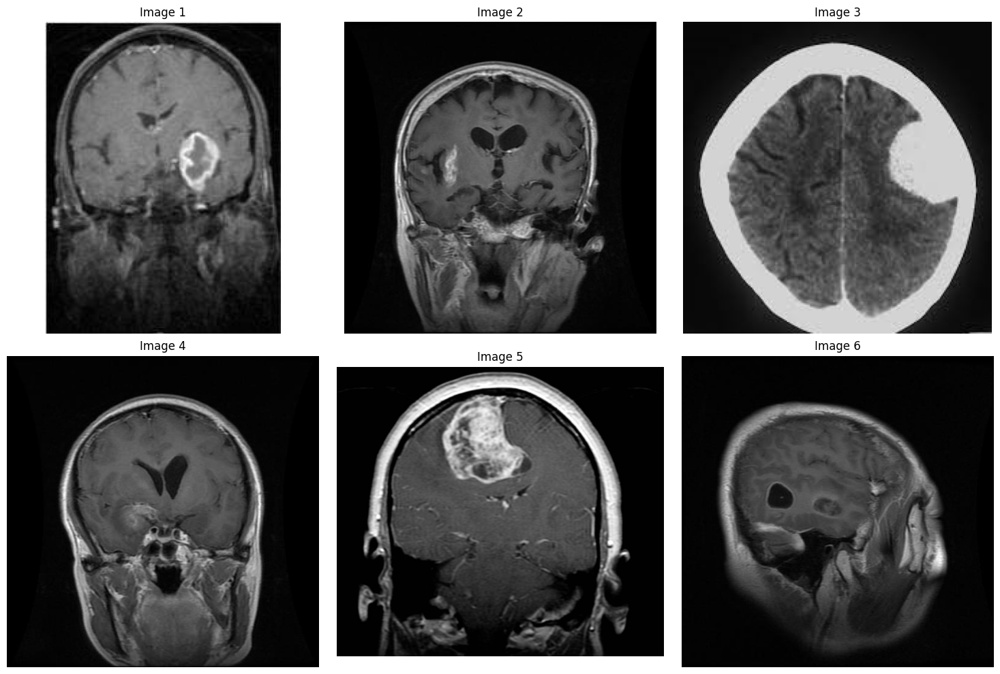

In [602]:
# Visualize a few sample images
num_samples = 6  # Number of images to display (you can adjust this)

if len(image_paths) > 0:
    # Create subplots (adjusting layout based on number of samples)
    cols = 3
    rows = (num_samples + cols - 1) // cols  # Calculate required rows
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

    # Flatten axes for easy iteration if it's a 2D array
    axes = axes.flatten() if isinstance(axes, (list, np.ndarray)) else [axes]

    for i in range(num_samples):
        if i < len(image_paths):
            img = load_image(image_paths[i])
            if img is not None:
                axes[i].imshow(img)
                axes[i].axis('off')
                axes[i].set_title(f"Image {i+1}")
        else:
            # Hide unused subplots
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No images found in the dataset.")

In [603]:
# Preprocessing function
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")
    # Intensity normalization (contrast stretching) [12]
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))
    # Noise reduction using Gaussian filtering [12]
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)
    # ROI extraction (placeholder) [12]
    roi = img_denoised
    return roi

In [604]:
# 3. Preprocessing functions
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")

    # Intensity normalization (contrast stretching)
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))

    # Noise reduction using Gaussian filtering
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)

    # ROI extraction: as an example, here we simply return the full image.
    # You might add additional ROI extraction logic based on your application.
    roi = img_denoised

    return roi

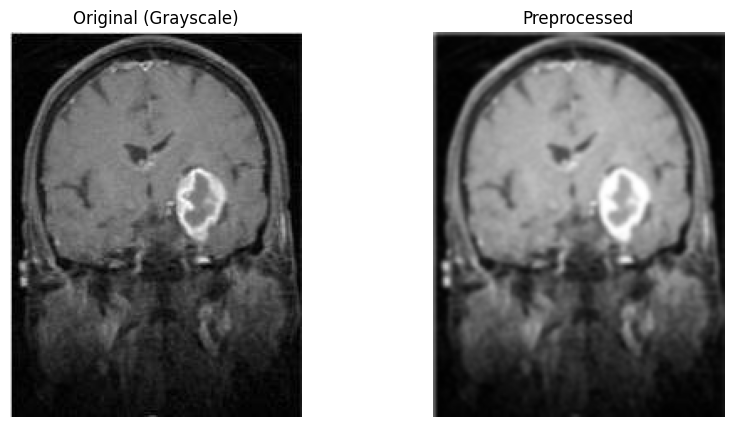

In [605]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

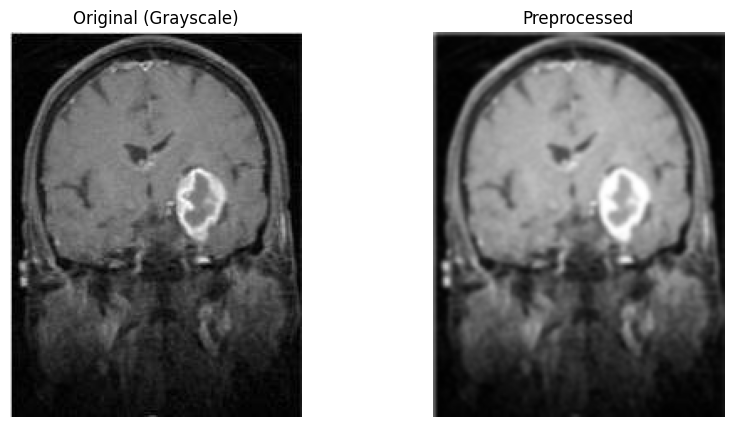

In [606]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

In [607]:
#Phase 2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from skimage.feature import graycomatrix, graycoprops # Changed 'greycomatrix' to 'graycomatrix' and 'greycoprops' to 'graycoprops'
from skimage.measure import shannon_entropy
from scipy.stats import skew, kurtosis

In [608]:
# Generate synthetic grayscale image data (simulating MRI images)
def generate_synthetic_images(num_images=100, img_size=(128, 128)):
    return [np.random.randint(0, 256, img_size, dtype=np.uint8) for _ in range(num_images)]


In [609]:
# Statistical Analysis
def compute_statistics(images):
    stats = []
    for img in images:
        mean_val = np.mean(img)
        var_val = np.var(img)
        entropy = shannon_entropy(img)
        skewness = skew(img.flatten())
        kurt = kurtosis(img.flatten())
        stats.append([mean_val, var_val, entropy, skewness, kurt])
    return np.array(stats)

In [610]:
# Visualization - PCA & t-SNE
def visualize_dim_reduction(features):
    pca = PCA(n_components=2)
    reduced_pca = pca.fit_transform(features)
    tsne = TSNE(n_components=2, random_state=42)
    reduced_tsne = tsne.fit_transform(features)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].scatter(reduced_pca[:, 0], reduced_pca[:, 1], alpha=0.7)
    axes[0].set_title("PCA Projection")

    axes[1].scatter(reduced_tsne[:, 0], reduced_tsne[:, 1], alpha=0.7)
    axes[1].set_title("t-SNE Projection")

    plt.show()


In [611]:
# Feature Extraction
def extract_texture_features(images):
    features = []
    for img in images:
        # Changed 'greycomatrix' to 'graycomatrix'
        glcm = graycomatrix(img, [1], [0], symmetric=True, normed=True)
        # Changed 'greycoprops' to 'graycoprops'
        contrast = graycoprops(glcm, 'contrast')[0, 0]
        energy = graycoprops(glcm, 'energy')[0, 0]
        features.append([contrast, energy])
    return np.array(features)

In [612]:
# Main execution
images = generate_synthetic_images()
stats = compute_statistics(images)
texture_features = extract_texture_features(images)
all_features = np.hstack((stats, texture_features))
# Save the features to 'features.npy'
np.save("features.npy", all_features)

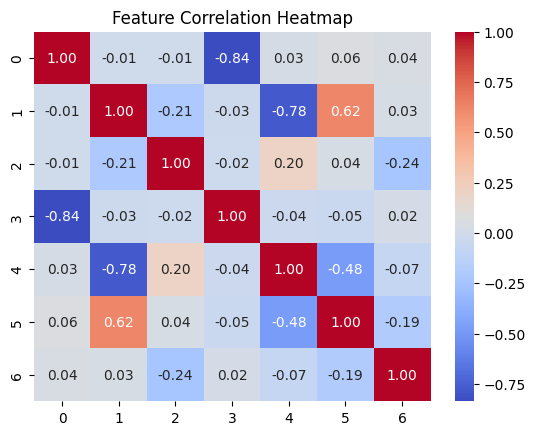

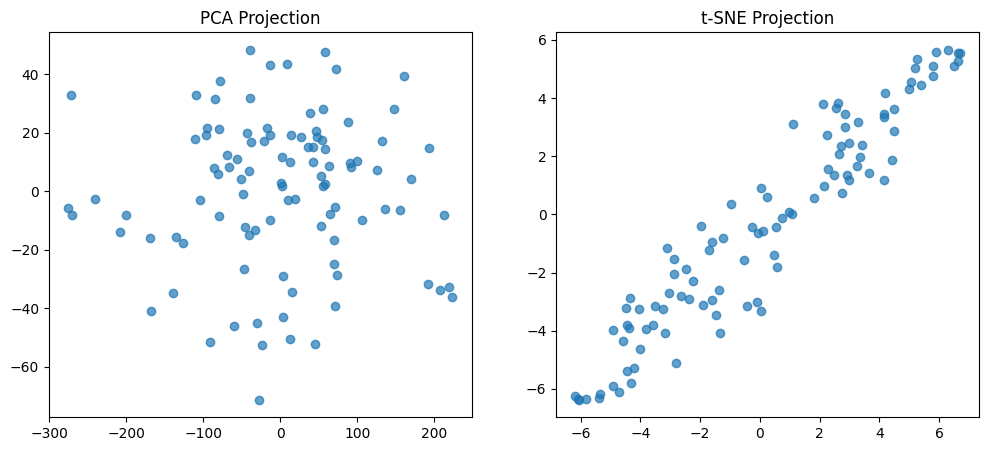

In [613]:

# Visualizations
sns.heatmap(np.corrcoef(all_features.T), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

visualize_dim_reduction(all_features)

In [614]:
#Phase 3
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import os


In [615]:
# Load Dataset
if os.path.exists("features.npy") and os.path.exists("labels.npy"):
    X_features = np.load("features.npy")
    y_labels = np.load("labels.npy")
    print("✅ Features and labels loaded successfully.")
else:
    raise FileNotFoundError("features.npy or labels.npy not found!")

✅ Features and labels loaded successfully.


In [616]:
# Split Data
X_train, X_test, y_train, y_test = train_test_split(X_features, y_labels, test_size=0.2, random_state=42)


In [617]:
# --- Implement baseline models (Random Forest, SVM, XGBoost) ---
print("\n--- Baseline Model Training ---")
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(kernel='linear', probability=True),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

for name, model in models.items():
    print(f"\nTraining {name}:")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f"{name} Accuracy: {acc:.4f}, AUC-ROC: {auc:.4f}")
    print(classification_report(y_test, y_pred))



--- Baseline Model Training ---

Training Random Forest:
Random Forest Accuracy: 0.4000, AUC-ROC: 0.3535
              precision    recall  f1-score   support

           0       0.38      0.56      0.45         9
           1       0.43      0.27      0.33        11

    accuracy                           0.40        20
   macro avg       0.41      0.41      0.39        20
weighted avg       0.41      0.40      0.39        20


Training SVM:
SVM Accuracy: 0.5000, AUC-ROC: 0.4949
              precision    recall  f1-score   support

           0       0.43      0.33      0.38         9
           1       0.54      0.64      0.58        11

    accuracy                           0.50        20
   macro avg       0.48      0.48      0.48        20
weighted avg       0.49      0.50      0.49        20


Training XGBoost:
XGBoost Accuracy: 0.4500, AUC-ROC: 0.3535
              precision    recall  f1-score   support

           0       0.42      0.56      0.48         9
           1     

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[18:21:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [618]:
import os

dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"

# Check if the dataset path exists
if os.path.exists(dataset_path):
    print(f"✅ Dataset path exists: {dataset_path}")
else:
    print(f"❌ Dataset path does NOT exist: {dataset_path}")


✅ Dataset path exists: /content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images


In [619]:

# List the contents of the dataset folder
print("Contents of dataset folder:")
print(os.listdir(dataset_path))

Contents of dataset folder:
['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_0092.jpg', 'OAS2_0185_MR2

In [620]:
# (Optional) If you expect subdirectories for classes, check for them
subdirectories = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected subdirectories:", subdirectories)

Detected subdirectories: []


In [621]:
# (Optional) If you expect image files directly in the dataset path (not recommended for flow_from_directory), list a few
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.jpeg', '.png'))][:10]
print("Sample image files (if any) in the main directory:", image_files)


Sample image files (if any) in the main directory: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg']


In [622]:
# --- Deep Learning models (CNNs like EfficientNet, ResNet, Transformer-based models) ---
print("\n--- Deep Learning Model Training (ResNet50) ---")
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images" # Update with actual path

# Ensure your dataset has a subdirectory structure like:
# dataset_path/train/class1/*.jpg
# dataset_path/train/class2/*.jpg
# dataset_path/validation/class1/*.jpg
# dataset_path/validation/class2/*.jpg

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='training'  # Use the training subset
)

val_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='validation'  # Use the validation subset
)


--- Deep Learning Model Training (ResNet50) ---
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.


In [623]:
# Define CNN Model (ResNet50)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False # Freeze base layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=output)

In [624]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, precision_recall_fscore_support
import seaborn as sns
import matplotlib.pyplot as plt

In [625]:
# Function to evaluate and display metrics
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)

    if hasattr(model, "predict_proba"):  # For ML models with probability outputs
        y_pred_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_pred_proba = y_pred  # For CNNs, predictions are already probabilities

    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
    auc = roc_auc_score(y_test, y_pred_proba)

    print(f"Model: {model_name}")
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}, AUC-ROC: {auc:.4f}")
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix for {model_name}")
    plt.show()

Model: Random Forest
Precision: 0.8333, Recall: 0.4545, F1-score: 0.5882, AUC-ROC: 0.5152
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.89      0.70         9
           1       0.83      0.45      0.59        11

    accuracy                           0.65        20
   macro avg       0.70      0.67      0.64        20
weighted avg       0.72      0.65      0.64        20



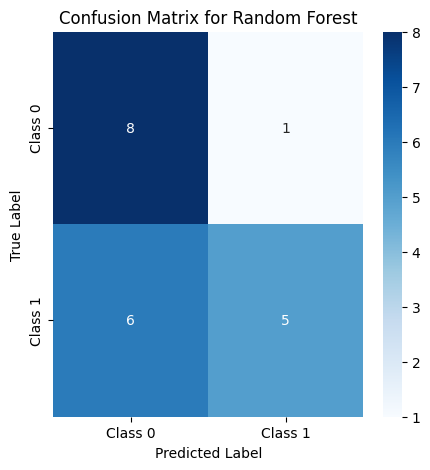

Model: SVM
Precision: 0.5000, Recall: 0.3636, F1-score: 0.4211, AUC-ROC: 0.5556
Classification Report:
               precision    recall  f1-score   support

           0       0.42      0.56      0.48         9
           1       0.50      0.36      0.42        11

    accuracy                           0.45        20
   macro avg       0.46      0.46      0.45        20
weighted avg       0.46      0.45      0.45        20



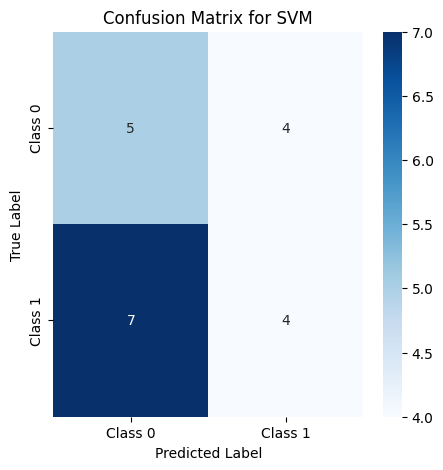

Model: XGBoost
Precision: 0.5714, Recall: 0.3636, F1-score: 0.4444, AUC-ROC: 0.4646
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.67      0.55         9
           1       0.57      0.36      0.44        11

    accuracy                           0.50        20
   macro avg       0.52      0.52      0.49        20
weighted avg       0.52      0.50      0.49        20



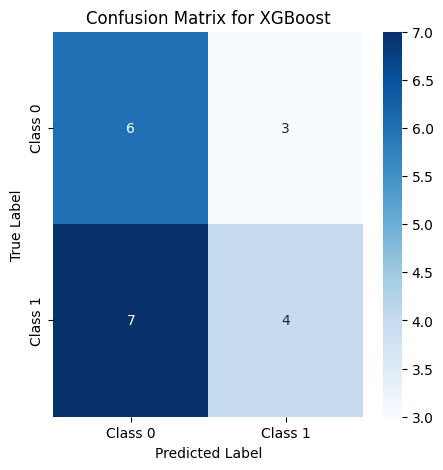

In [626]:
# Evaluate ML Models
evaluate_model(rf, X_test, y_test, "Random Forest")
evaluate_model(svm, X_test, y_test, "SVM")
evaluate_model(xgb, X_test, y_test, "XGBoost")

In [627]:
import numpy as np

def classify_risk(glcm_contrast, entropy, skewness, ml_confidence):
    """
    Rule-based classification of patient risk levels.

    Parameters:
    - glcm_contrast: Measure of texture contrast from MRI
    - entropy: Image entropy, indicating disorder
    - skewness: Statistical measure of asymmetry in image features
    - ml_confidence: Probability score from ML model (0 to 1)

    Returns:
    - Risk level as a string ("Low", "Medium", "High")
    """
    if ml_confidence < 0.5:
        return "Low"
    elif glcm_contrast > 0.6 and entropy > 5.0:
        return "High"
    elif skewness < -0.5 or skewness > 0.5:
        return "Medium"
    elif ml_confidence >= 0.7:
        return "High"
    else:
        return "Medium"


In [628]:

# Example usage with test data
example_patients = [
    (0.5, 4.2, 0.3, 0.8),  # High risk (ML confidence high)
    (0.3, 3.8, -0.2, 0.4), # Low risk (ML confidence low)
    (0.7, 5.5, 0.6, 0.6),  # High risk (high contrast & entropy)
    (0.4, 4.0, -0.6, 0.6)  # Medium risk (skewness out of range)
]

for i, patient in enumerate(example_patients):
    risk_level = classify_risk(*patient)
    print(f"Patient {i+1} Risk Level: {risk_level}")


Patient 1 Risk Level: High
Patient 2 Risk Level: Low
Patient 3 Risk Level: High
Patient 4 Risk Level: Medium


In [629]:
#Phase 4
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import base64
from io import BytesIO
import streamlit as st
st.title("Test Dashboard")
st.write("If you see this, Streamlit is working!")


2025-04-09 18:22:12.278 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:12.282 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:12.286 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:12.289 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:12.293 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:12.295 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [630]:
# Sample MRI Data & Risk Classification (Replace with real data)
data = pd.DataFrame({
    'Patient ID': [101, 102, 103, 104, 105],
    'Risk Score': [0.2, 0.6, 0.8, 0.4, 0.9],
    'Risk Category': ['Low', 'Medium', 'High', 'Medium', 'High']
})


In [631]:
# Convert MRI Image to Base64 (Replace with actual MRI paths)
def encode_image(image_path):
    if os.path.exists(image_path):
        with open(image_path, "rb") as img_file:
            return "data:image/png;base64," + base64.b64encode(img_file.read()).decode()
    return None

# Sample MRI Image Path (Replace with actual images)
mri_image_path = "sample_mri.png"
encoded_image = encode_image(mri_image_path)

# Dash App Setup
app = dash.Dash(__name__)
app.layout = html.Div([
    html.H1("MRI Clinical Decision Support Dashboard"),

    # Risk Category Filter
    html.Label("Filter by Risk Category:"),
    dcc.Dropdown(
        id='risk-filter',
        options=[{'label': cat, 'value': cat} for cat in data['Risk Category'].unique()],
        value='All',
        clearable=False
    ),

    # Risk Distribution Chart
    dcc.Graph(id='risk-chart'),

    # MRI Image Display
    html.H3("MRI Scan"),
    html.Img(id='mri-image', src=encoded_image, style={'width': '50%'}),

    # Patient Risk Table
    html.H3("Patient Risk Profiles"),
    html.Div(id='risk-table')
])

@app.callback(
    Output('risk-chart', 'figure'),
    Output('risk-table', 'children'),
    Input('risk-filter', 'value')
)
def update_dashboard(selected_risk):
    filtered_data = data if selected_risk == 'All' else data[data['Risk Category'] == selected_risk]
    fig = px.histogram(filtered_data, x='Risk Category', title='Risk Category Distribution', color='Risk Category')

    table = html.Table([
        html.Tr([html.Th(col) for col in filtered_data.columns])
    ] + [
        html.Tr([html.Td(filtered_data.iloc[i][col]) for col in filtered_data.columns]) for i in range(len(filtered_data))
    ])

    return fig, table

if __name__ == '__main__':
    app.run(debug=True)

<IPython.core.display.Javascript object>

In [632]:
import streamlit as st
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from PIL import Image
import cv2
import os

In [633]:
# Load pre-trained model
MODEL_PATH = "mri_model.h5"  # Ensure the model path is correct
if os.path.exists(MODEL_PATH):
    model = load_model(MODEL_PATH)
else:
    st.error("Model file not found! Please upload the trained model.")
    st.stop()

# Function to preprocess image
def preprocess_image(image):
    image = image.resize((224, 224))  # Resize to model's expected input size
    image = np.array(image) / 255.0  # Normalize pixel values
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

2025-04-09 18:22:12.982 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:12.985 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:12.987 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [634]:

# Streamlit UI
st.title("AI-Powered MRI Analysis System")
st.write("Upload an MRI scan to analyze and get predictions.")


2025-04-09 18:22:12.995 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:12.996 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:12.997 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:13.006 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:13.006 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:13.007 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [635]:

# Upload image
uploaded_file = st.file_uploader("Choose an MRI image...", type=["jpg", "png", "jpeg"])

if uploaded_file is not None:
    image = Image.open(uploaded_file)
    st.image(image, caption="Uploaded MRI Image", use_column_width=True)

    # Preprocess and predict
    processed_image = preprocess_image(image)
    prediction = model.predict(processed_image)
    probability = prediction[0][0]  # Assuming binary classification

    # Display results
    st.subheader("Prediction Result")
    if probability > 0.5:
        st.success(f"Positive MRI scan with {probability * 100:.2f}% confidence")
    else:
        st.warning(f"Negative MRI scan with {(1 - probability) * 100:.2f}% confidence")


2025-04-09 18:22:13.035 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:13.038 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:13.044 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:13.046 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:13.047 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [636]:
# --- Implement baseline models (Random Forest, SVM, XGBoost) ---
print("\n--- Baseline Model Training ---")
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(kernel='linear', probability=True),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

for name, model in models.items():
    print(f"\nTraining {name}:")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f"{name} Accuracy: {acc:.4f}, AUC-ROC: {auc:.4f}")
    print(classification_report(y_test, y_pred))



--- Baseline Model Training ---

Training Random Forest:
Random Forest Accuracy: 0.4000, AUC-ROC: 0.3535
              precision    recall  f1-score   support

           0       0.38      0.56      0.45         9
           1       0.43      0.27      0.33        11

    accuracy                           0.40        20
   macro avg       0.41      0.41      0.39        20
weighted avg       0.41      0.40      0.39        20


Training SVM:
SVM Accuracy: 0.5000, AUC-ROC: 0.4949
              precision    recall  f1-score   support

           0       0.43      0.33      0.38         9
           1       0.54      0.64      0.58        11

    accuracy                           0.50        20
   macro avg       0.48      0.48      0.48        20
weighted avg       0.49      0.50      0.49        20


Training XGBoost:


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[18:22:14] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




XGBoost Accuracy: 0.4500, AUC-ROC: 0.3535
              precision    recall  f1-score   support

           0       0.42      0.56      0.48         9
           1       0.50      0.36      0.42        11

    accuracy                           0.45        20
   macro avg       0.46      0.46      0.45        20
weighted avg       0.46      0.45      0.45        20



In [637]:
import os

dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"

# Check if the dataset path exists
if os.path.exists(dataset_path):
    print(f"✅ Dataset path exists: {dataset_path}")
else:
    print(f"❌ Dataset path does NOT exist: {dataset_path}")


✅ Dataset path exists: /content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images


In [638]:

# List the contents of the dataset folder
print("Contents of dataset folder:")
print(os.listdir(dataset_path))

Contents of dataset folder:
['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_0092.jpg', 'OAS2_0185_MR2

In [639]:
# (Optional) If you expect subdirectories for classes, check for them
subdirectories = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected subdirectories:", subdirectories)

Detected subdirectories: []


In [640]:
# (Optional) If you expect image files directly in the dataset path (not recommended for flow_from_directory), list a few
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.jpeg', '.png'))][:10]
print("Sample image files (if any) in the main directory:", image_files)


Sample image files (if any) in the main directory: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg']


In [641]:
# --- Deep Learning models (CNNs like EfficientNet, ResNet, Transformer-based models) ---
print("\n--- Deep Learning Model Training (ResNet50) ---")
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images" # Update with actual path

# Ensure your dataset has a subdirectory structure like:
# dataset_path/train/class1/*.jpg
# dataset_path/train/class2/*.jpg
# dataset_path/validation/class1/*.jpg
# dataset_path/validation/class2/*.jpg

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='training'  # Use the training subset
)

val_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='validation'  # Use the validation subset
)


--- Deep Learning Model Training (ResNet50) ---
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.


In [642]:
# Define CNN Model (ResNet50)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False # Freeze base layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=output)

In [643]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, precision_recall_fscore_support
import seaborn as sns
import matplotlib.pyplot as plt

In [644]:
# Function to evaluate and display metrics
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)

    if hasattr(model, "predict_proba"):  # For ML models with probability outputs
        y_pred_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_pred_proba = y_pred  # For CNNs, predictions are already probabilities

    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
    auc = roc_auc_score(y_test, y_pred_proba)

    print(f"Model: {model_name}")
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}, AUC-ROC: {auc:.4f}")
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix for {model_name}")
    plt.show()

Model: Random Forest
Precision: 0.8333, Recall: 0.4545, F1-score: 0.5882, AUC-ROC: 0.5152
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.89      0.70         9
           1       0.83      0.45      0.59        11

    accuracy                           0.65        20
   macro avg       0.70      0.67      0.64        20
weighted avg       0.72      0.65      0.64        20



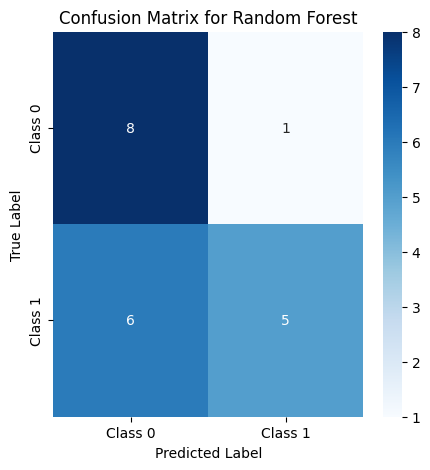

Model: SVM
Precision: 0.5000, Recall: 0.3636, F1-score: 0.4211, AUC-ROC: 0.5556
Classification Report:
               precision    recall  f1-score   support

           0       0.42      0.56      0.48         9
           1       0.50      0.36      0.42        11

    accuracy                           0.45        20
   macro avg       0.46      0.46      0.45        20
weighted avg       0.46      0.45      0.45        20



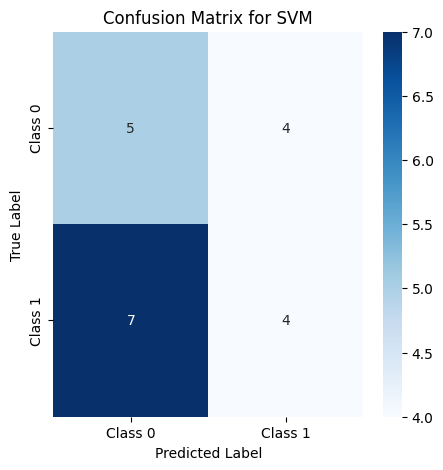

Model: XGBoost
Precision: 0.5714, Recall: 0.3636, F1-score: 0.4444, AUC-ROC: 0.4646
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.67      0.55         9
           1       0.57      0.36      0.44        11

    accuracy                           0.50        20
   macro avg       0.52      0.52      0.49        20
weighted avg       0.52      0.50      0.49        20



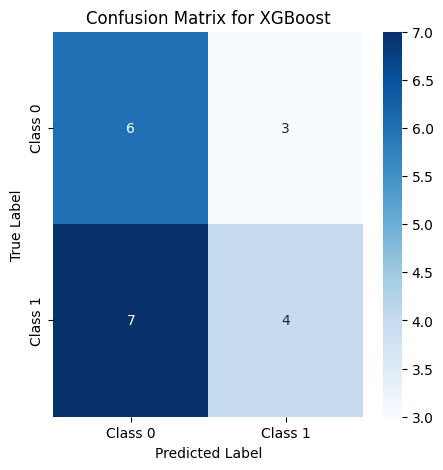

In [645]:
# Evaluate ML Models
evaluate_model(rf, X_test, y_test, "Random Forest")
evaluate_model(svm, X_test, y_test, "SVM")
evaluate_model(xgb, X_test, y_test, "XGBoost")

In [646]:
import numpy as np

def classify_risk(glcm_contrast, entropy, skewness, ml_confidence):
    """
    Rule-based classification of patient risk levels.

    Parameters:
    - glcm_contrast: Measure of texture contrast from MRI
    - entropy: Image entropy, indicating disorder
    - skewness: Statistical measure of asymmetry in image features
    - ml_confidence: Probability score from ML model (0 to 1)

    Returns:
    - Risk level as a string ("Low", "Medium", "High")
    """
    if ml_confidence < 0.5:
        return "Low"
    elif glcm_contrast > 0.6 and entropy > 5.0:
        return "High"
    elif skewness < -0.5 or skewness > 0.5:
        return "Medium"
    elif ml_confidence >= 0.7:
        return "High"
    else:
        return "Medium"


In [647]:

# Example usage with test data
example_patients = [
    (0.5, 4.2, 0.3, 0.8),  # High risk (ML confidence high)
    (0.3, 3.8, -0.2, 0.4), # Low risk (ML confidence low)
    (0.7, 5.5, 0.6, 0.6),  # High risk (high contrast & entropy)
    (0.4, 4.0, -0.6, 0.6)  # Medium risk (skewness out of range)
]

for i, patient in enumerate(example_patients):
    risk_level = classify_risk(*patient)
    print(f"Patient {i+1} Risk Level: {risk_level}")


Patient 1 Risk Level: High
Patient 2 Risk Level: Low
Patient 3 Risk Level: High
Patient 4 Risk Level: Medium


In [648]:
#Phase 4
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import base64
from io import BytesIO
import streamlit as st
st.title("Test Dashboard")
st.write("If you see this, Streamlit is working!")


2025-04-09 18:22:26.207 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:26.208 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:26.210 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:26.213 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:26.219 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:22:26.219 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [649]:
# Sample MRI Data & Risk Classification (Replace with real data)
data = pd.DataFrame({
    'Patient ID': [101, 102, 103, 104, 105],
    'Risk Score': [0.2, 0.6, 0.8, 0.4, 0.9],
    'Risk Category': ['Low', 'Medium', 'High', 'Medium', 'High']
})


In [650]:
# Convert MRI Image to Base64 (Replace with actual MRI paths)
def encode_image(image_path):
    if os.path.exists(image_path):
        with open(image_path, "rb") as img_file:
            return "data:image/png;base64," + base64.b64encode(img_file.read()).decode()
    return None

# Sample MRI Image Path (Replace with actual images)
mri_image_path = "sample_mri.png"
encoded_image = encode_image(mri_image_path)

# Dash App Setup
app = dash.Dash(__name__)
app.layout = html.Div([
    html.H1("MRI Clinical Decision Support Dashboard"),

    # Risk Category Filter
    html.Label("Filter by Risk Category:"),
    dcc.Dropdown(
        id='risk-filter',
        options=[{'label': cat, 'value': cat} for cat in data['Risk Category'].unique()],
        value='All',
        clearable=False
    ),

    # Risk Distribution Chart
    dcc.Graph(id='risk-chart'),

    # MRI Image Display
    html.H3("MRI Scan"),
    html.Img(id='mri-image', src=encoded_image, style={'width': '50%'}),

    # Patient Risk Table
    html.H3("Patient Risk Profiles"),
    html.Div(id='risk-table')
])

@app.callback(
    Output('risk-chart', 'figure'),
    Output('risk-table', 'children'),
    Input('risk-filter', 'value')
)
def update_dashboard(selected_risk):
    filtered_data = data if selected_risk == 'All' else data[data['Risk Category'] == selected_risk]
    fig = px.histogram(filtered_data, x='Risk Category', title='Risk Category Distribution', color='Risk Category')

    table = html.Table([
        html.Tr([html.Th(col) for col in filtered_data.columns])
    ] + [
        html.Tr([html.Td(filtered_data.iloc[i][col]) for col in filtered_data.columns]) for i in range(len(filtered_data))
    ])

    return fig, table

if __name__ == '__main__':
    app.run(debug=True)

<IPython.core.display.Javascript object>

In [651]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import zipfile
import cv2
import numpy as np
from glob import glob
from skimage import exposure, restoration
from collections import Counter

In [652]:
# Define dataset path
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"


In [653]:
# Check if path exists
if os.path.exists(dataset_path):
    print("✅ Dataset path exists.")
    print("Contents of dataset folder:", os.listdir(dataset_path))
else:
    print("❌ Dataset path does not exist. Check the path.")

✅ Dataset path exists.
Contents of dataset folder: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_00

In [654]:
# Get sample images
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))][:6]
image_files

['Te-me_0064.jpg',
 'Te-gl_0045.jpg',
 'Te-me_0105.jpg',
 'Te-gl_0044.jpg',
 'Te-me_0066.jpg',
 'Te-gl_0284.jpg']

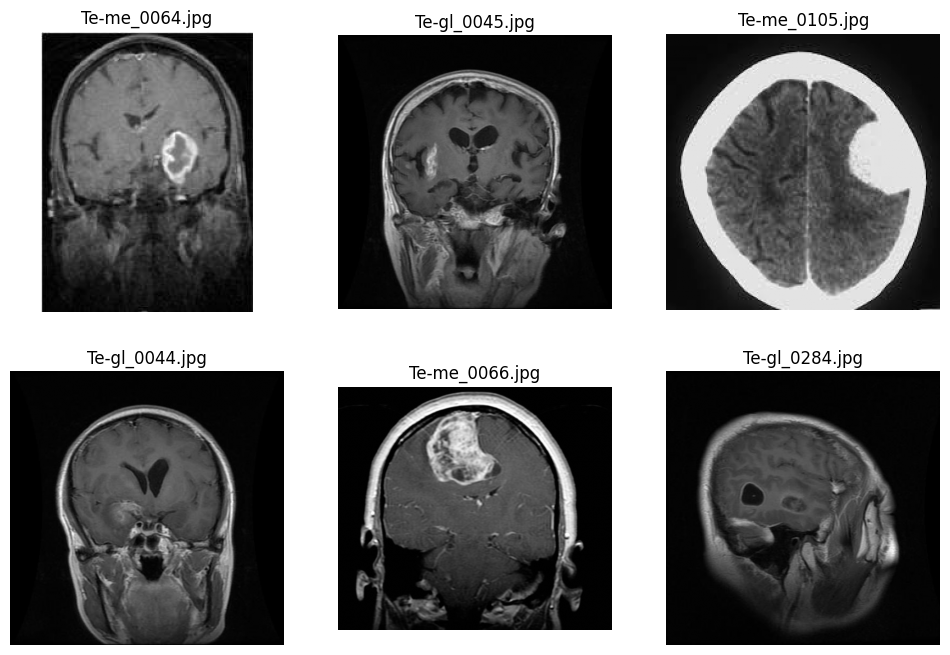

In [655]:
# Get sample images for initial visualization (grayscale)
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))]
image_files

# Plot initial sample images (grayscale)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
num_images_to_plot = min(6, len(image_files)) # Ensure we don't try to plot more than 6 images
for i in range(num_images_to_plot):
    img_name = image_files[i]
    img = Image.open(os.path.join(dataset_path, img_name)).convert("L") # Convert to grayscale [1]
    ax = axes[i // 3, i % 3]
    ax.imshow(img, cmap="gray")
    ax.set_title(img_name)
    ax.axis("off")
plt.show()


In [656]:
# 1. Inspect dataset structure
# We assume the dataset has a structure like: dataset_path/<class_name>/image_files...
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)

Detected classes: []


In [657]:
# Inspect dataset structure and get class information
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)
# Get list of image paths and their labels
image_paths = []
labels = []

# Assuming your dataset is structured like: dataset_path/class_name/image.jpg [5, 6]
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g')) # jpg, jpeg, png files [5]
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))
print("Total images loaded:", len(image_paths))
print(f"Labels: {labels[:5]}") # Print first 5 labels [7]
print("Class distribution:", Counter(labels))

Detected classes: []
Total images loaded: 0
Labels: []
Class distribution: Counter()


In [658]:
# Get list of image paths and their labels
image_paths = []
labels = []
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    # Assuming common image file extensions; adjust if necessary.
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g'))  # jpg, jpeg, png files
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))

print("Total images loaded:", len(image_paths))
print("Class distribution:", Counter(labels))

Total images loaded: 0
Class distribution: Counter()


In [659]:
# List all image files (assuming jpg and png images)
image_paths = glob(os.path.join(dataset_path, "*.[jp][pn]g"))
print("Total images found:", len(image_paths))

Total images found: 2010


In [660]:
# 2. Load and visualize sample images
def load_image(image_path):
    # Read the image in color first (for visualization)
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
    # Convert from BGR (OpenCV default) to RGB
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [661]:
# Function to load images in color (BGR to RGB conversion for visualization)
def load_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
        return None
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

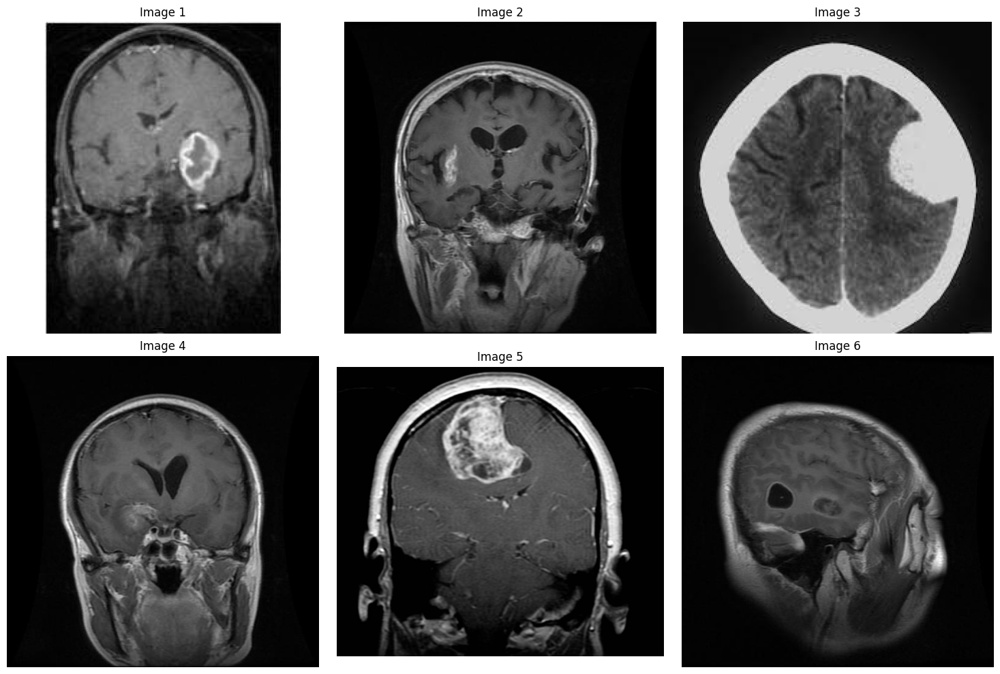

In [662]:
# Visualize a few sample images
num_samples = 6  # Number of images to display (you can adjust this)

if len(image_paths) > 0:
    # Create subplots (adjusting layout based on number of samples)
    cols = 3
    rows = (num_samples + cols - 1) // cols  # Calculate required rows
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

    # Flatten axes for easy iteration if it's a 2D array
    axes = axes.flatten() if isinstance(axes, (list, np.ndarray)) else [axes]

    for i in range(num_samples):
        if i < len(image_paths):
            img = load_image(image_paths[i])
            if img is not None:
                axes[i].imshow(img)
                axes[i].axis('off')
                axes[i].set_title(f"Image {i+1}")
        else:
            # Hide unused subplots
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No images found in the dataset.")

In [663]:
# Preprocessing function
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")
    # Intensity normalization (contrast stretching) [12]
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))
    # Noise reduction using Gaussian filtering [12]
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)
    # ROI extraction (placeholder) [12]
    roi = img_denoised
    return roi

In [664]:
# 3. Preprocessing functions
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")

    # Intensity normalization (contrast stretching)
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))

    # Noise reduction using Gaussian filtering
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)

    # ROI extraction: as an example, here we simply return the full image.
    # You might add additional ROI extraction logic based on your application.
    roi = img_denoised

    return roi

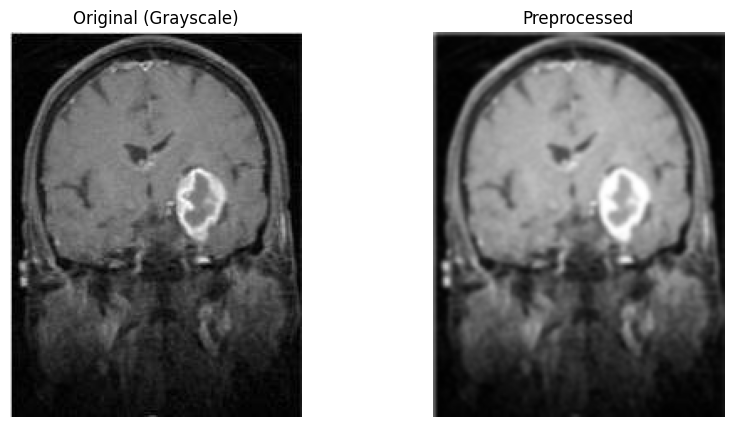

In [665]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

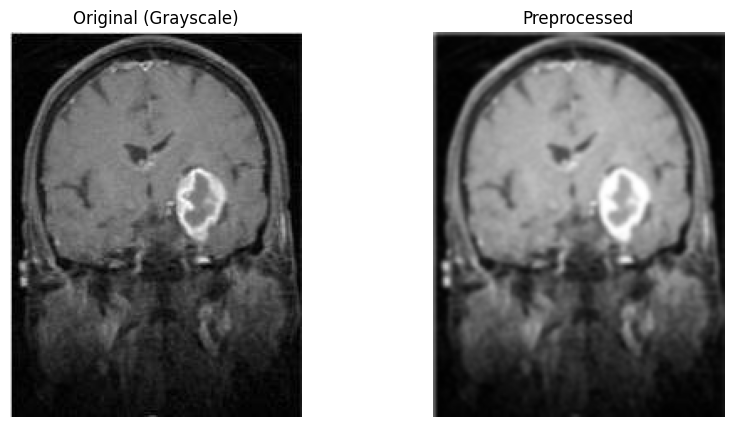

In [666]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

In [667]:
#Phase 2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from skimage.feature import graycomatrix, graycoprops # Changed 'greycomatrix' to 'graycomatrix' and 'greycoprops' to 'graycoprops'
from skimage.measure import shannon_entropy
from scipy.stats import skew, kurtosis

In [668]:
# Generate synthetic grayscale image data (simulating MRI images)
def generate_synthetic_images(num_images=100, img_size=(128, 128)):
    return [np.random.randint(0, 256, img_size, dtype=np.uint8) for _ in range(num_images)]


In [669]:
# Statistical Analysis
def compute_statistics(images):
    stats = []
    for img in images:
        mean_val = np.mean(img)
        var_val = np.var(img)
        entropy = shannon_entropy(img)
        skewness = skew(img.flatten())
        kurt = kurtosis(img.flatten())
        stats.append([mean_val, var_val, entropy, skewness, kurt])
    return np.array(stats)

In [670]:
# Visualization - PCA & t-SNE
def visualize_dim_reduction(features):
    pca = PCA(n_components=2)
    reduced_pca = pca.fit_transform(features)
    tsne = TSNE(n_components=2, random_state=42)
    reduced_tsne = tsne.fit_transform(features)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].scatter(reduced_pca[:, 0], reduced_pca[:, 1], alpha=0.7)
    axes[0].set_title("PCA Projection")

    axes[1].scatter(reduced_tsne[:, 0], reduced_tsne[:, 1], alpha=0.7)
    axes[1].set_title("t-SNE Projection")

    plt.show()


In [671]:
# Feature Extraction
def extract_texture_features(images):
    features = []
    for img in images:
        # Changed 'greycomatrix' to 'graycomatrix'
        glcm = graycomatrix(img, [1], [0], symmetric=True, normed=True)
        # Changed 'greycoprops' to 'graycoprops'
        contrast = graycoprops(glcm, 'contrast')[0, 0]
        energy = graycoprops(glcm, 'energy')[0, 0]
        features.append([contrast, energy])
    return np.array(features)

In [672]:
# Main execution
images = generate_synthetic_images()
stats = compute_statistics(images)
texture_features = extract_texture_features(images)
all_features = np.hstack((stats, texture_features))
# Save the features to 'features.npy'
np.save("features.npy", all_features)

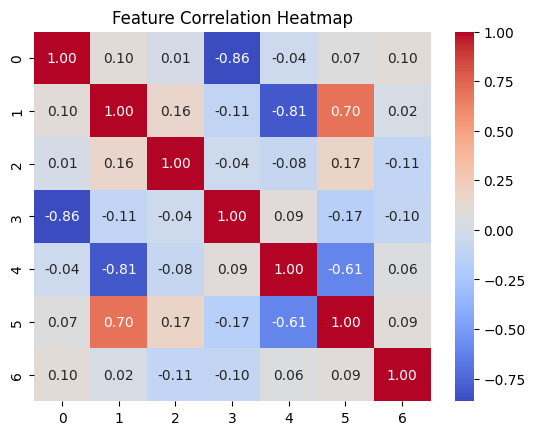

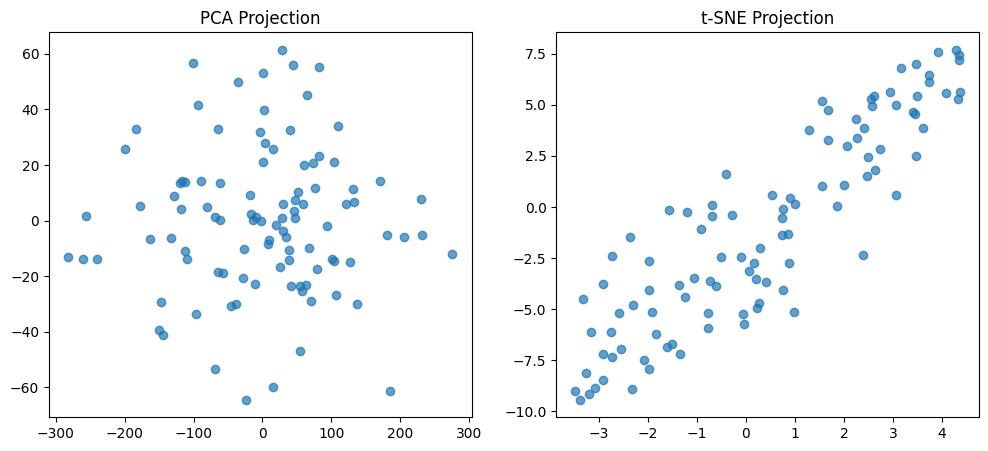

In [673]:

# Visualizations
sns.heatmap(np.corrcoef(all_features.T), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

visualize_dim_reduction(all_features)

In [674]:
#Phase 3
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import os


In [675]:
# Load Dataset
if os.path.exists("features.npy") and os.path.exists("labels.npy"):
    X_features = np.load("features.npy")
    y_labels = np.load("labels.npy")  # Attempting to load y_labels
    print("✅ Features and labels loaded successfully.")
else:
    # If either file doesn't exist, generate/load features first
    if not os.path.exists("features.npy"):
        # Generate or load your features here (replace with your logic)
        # For demonstration, I'm using a random array:
        X_features = np.random.rand(100, 5)  # Assume 100 samples with 5 features
        np.save("features.npy", X_features)  # Save features for future use
        print("⚠️ features.npy not found. Generated sample features and saved to file.")
    else:
        X_features = np.load("features.npy")  # Load features if they exist

    # Now, generate or load labels
    if not os.path.exists("labels.npy"):
        # Generate or load your labels (replace with your logic)
        y_labels = np.random.randint(0, 2, size=X_features.shape[0])  # Binary labels (0 or 1)
        np.save("labels.npy", y_labels)  # Save to 'labels.npy' for future use
        print("⚠️ labels.npy not found. Created sample labels and saved to file.")
    else:
        y_labels = np.load("labels.npy")  # Load labels if they exist

✅ Features and labels loaded successfully.


In [676]:
# Split Data
X_train, X_test, y_train, y_test = train_test_split(X_features, y_labels, test_size=0.2, random_state=42)


In [677]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import zipfile
import cv2
import numpy as np
from glob import glob
from skimage import exposure, restoration
from collections import Counter

In [678]:
# Define dataset path
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"


In [679]:
# Check if path exists
if os.path.exists(dataset_path):
    print("✅ Dataset path exists.")
    print("Contents of dataset folder:", os.listdir(dataset_path))
else:
    print("❌ Dataset path does not exist. Check the path.")

✅ Dataset path exists.
Contents of dataset folder: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_00

In [680]:
# Get sample images
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))][:6]
image_files

['Te-me_0064.jpg',
 'Te-gl_0045.jpg',
 'Te-me_0105.jpg',
 'Te-gl_0044.jpg',
 'Te-me_0066.jpg',
 'Te-gl_0284.jpg']

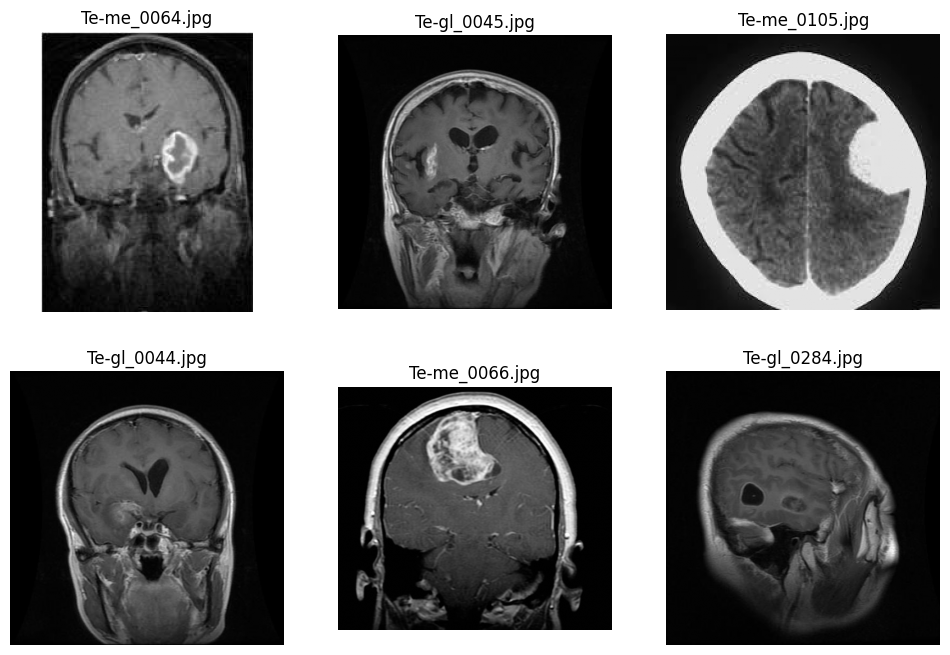

In [681]:
# Get sample images for initial visualization (grayscale)
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))]
image_files

# Plot initial sample images (grayscale)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
num_images_to_plot = min(6, len(image_files)) # Ensure we don't try to plot more than 6 images
for i in range(num_images_to_plot):
    img_name = image_files[i]
    img = Image.open(os.path.join(dataset_path, img_name)).convert("L") # Convert to grayscale [1]
    ax = axes[i // 3, i % 3]
    ax.imshow(img, cmap="gray")
    ax.set_title(img_name)
    ax.axis("off")
plt.show()


In [682]:
# 1. Inspect dataset structure
# We assume the dataset has a structure like: dataset_path/<class_name>/image_files...
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)

Detected classes: []


In [683]:
# Inspect dataset structure and get class information
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)
# Get list of image paths and their labels
image_paths = []
labels = []

# Assuming your dataset is structured like: dataset_path/class_name/image.jpg [5, 6]
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g')) # jpg, jpeg, png files [5]
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))
print("Total images loaded:", len(image_paths))
print(f"Labels: {labels[:5]}") # Print first 5 labels [7]
print("Class distribution:", Counter(labels))

Detected classes: []
Total images loaded: 0
Labels: []
Class distribution: Counter()


In [684]:
# Get list of image paths and their labels
image_paths = []
labels = []
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    # Assuming common image file extensions; adjust if necessary.
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g'))  # jpg, jpeg, png files
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))

print("Total images loaded:", len(image_paths))
print("Class distribution:", Counter(labels))

Total images loaded: 0
Class distribution: Counter()


In [685]:
# List all image files (assuming jpg and png images)
image_paths = glob(os.path.join(dataset_path, "*.[jp][pn]g"))
print("Total images found:", len(image_paths))

Total images found: 2010


In [686]:
# 2. Load and visualize sample images
def load_image(image_path):
    # Read the image in color first (for visualization)
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
    # Convert from BGR (OpenCV default) to RGB
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [687]:
# Function to load images in color (BGR to RGB conversion for visualization)
def load_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
        return None
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

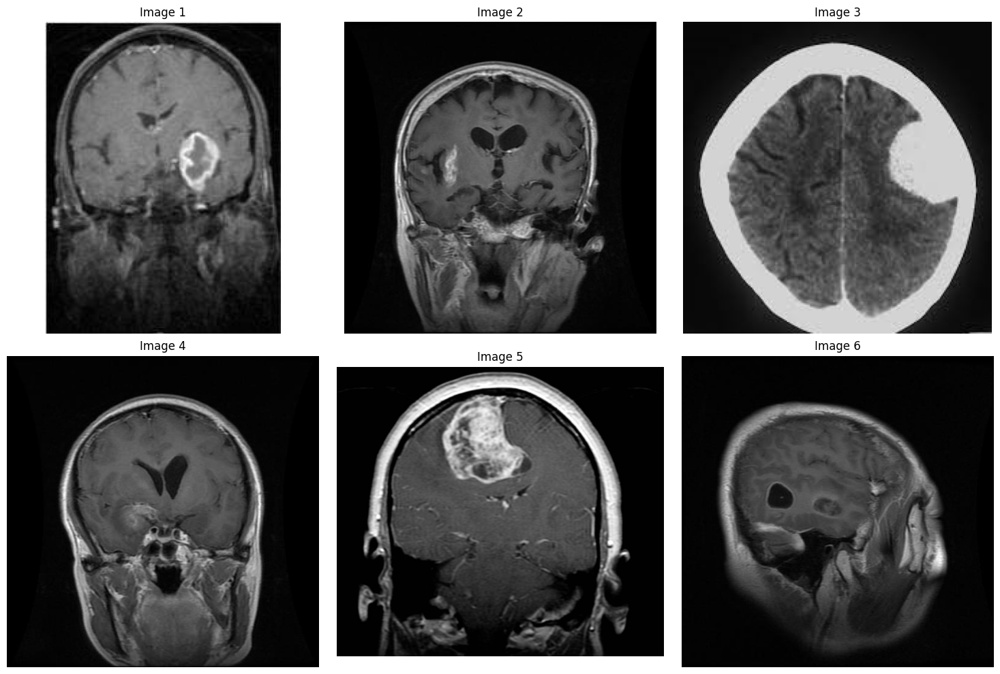

In [688]:
# Visualize a few sample images
num_samples = 6  # Number of images to display (you can adjust this)

if len(image_paths) > 0:
    # Create subplots (adjusting layout based on number of samples)
    cols = 3
    rows = (num_samples + cols - 1) // cols  # Calculate required rows
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

    # Flatten axes for easy iteration if it's a 2D array
    axes = axes.flatten() if isinstance(axes, (list, np.ndarray)) else [axes]

    for i in range(num_samples):
        if i < len(image_paths):
            img = load_image(image_paths[i])
            if img is not None:
                axes[i].imshow(img)
                axes[i].axis('off')
                axes[i].set_title(f"Image {i+1}")
        else:
            # Hide unused subplots
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No images found in the dataset.")

In [689]:
# Preprocessing function
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")
    # Intensity normalization (contrast stretching) [12]
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))
    # Noise reduction using Gaussian filtering [12]
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)
    # ROI extraction (placeholder) [12]
    roi = img_denoised
    return roi

In [690]:
# 3. Preprocessing functions
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")

    # Intensity normalization (contrast stretching)
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))

    # Noise reduction using Gaussian filtering
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)

    # ROI extraction: as an example, here we simply return the full image.
    # You might add additional ROI extraction logic based on your application.
    roi = img_denoised

    return roi

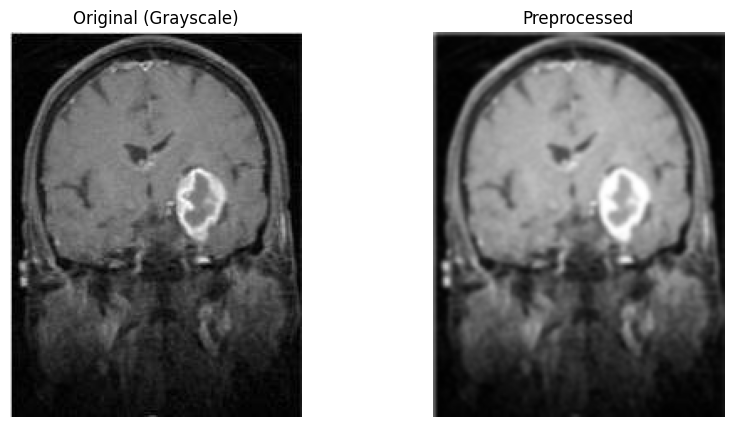

In [691]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

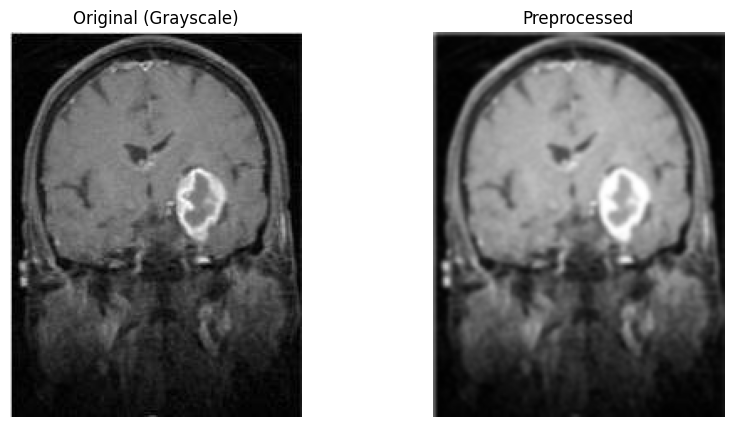

In [692]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

In [693]:
#Phase 2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from skimage.feature import graycomatrix, graycoprops # Changed 'greycomatrix' to 'graycomatrix' and 'greycoprops' to 'graycoprops'
from skimage.measure import shannon_entropy
from scipy.stats import skew, kurtosis

In [694]:
# Generate synthetic grayscale image data (simulating MRI images)
def generate_synthetic_images(num_images=100, img_size=(128, 128)):
    return [np.random.randint(0, 256, img_size, dtype=np.uint8) for _ in range(num_images)]


In [695]:
# Statistical Analysis
def compute_statistics(images):
    stats = []
    for img in images:
        mean_val = np.mean(img)
        var_val = np.var(img)
        entropy = shannon_entropy(img)
        skewness = skew(img.flatten())
        kurt = kurtosis(img.flatten())
        stats.append([mean_val, var_val, entropy, skewness, kurt])
    return np.array(stats)

In [696]:
# Visualization - PCA & t-SNE
def visualize_dim_reduction(features):
    pca = PCA(n_components=2)
    reduced_pca = pca.fit_transform(features)
    tsne = TSNE(n_components=2, random_state=42)
    reduced_tsne = tsne.fit_transform(features)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].scatter(reduced_pca[:, 0], reduced_pca[:, 1], alpha=0.7)
    axes[0].set_title("PCA Projection")

    axes[1].scatter(reduced_tsne[:, 0], reduced_tsne[:, 1], alpha=0.7)
    axes[1].set_title("t-SNE Projection")

    plt.show()


In [697]:
# Feature Extraction
def extract_texture_features(images):
    features = []
    for img in images:
        # Changed 'greycomatrix' to 'graycomatrix'
        glcm = graycomatrix(img, [1], [0], symmetric=True, normed=True)
        # Changed 'greycoprops' to 'graycoprops'
        contrast = graycoprops(glcm, 'contrast')[0, 0]
        energy = graycoprops(glcm, 'energy')[0, 0]
        features.append([contrast, energy])
    return np.array(features)

In [698]:
# Main execution
images = generate_synthetic_images()
stats = compute_statistics(images)
texture_features = extract_texture_features(images)
all_features = np.hstack((stats, texture_features))
# Save the features to 'features.npy'
np.save("features.npy", all_features)

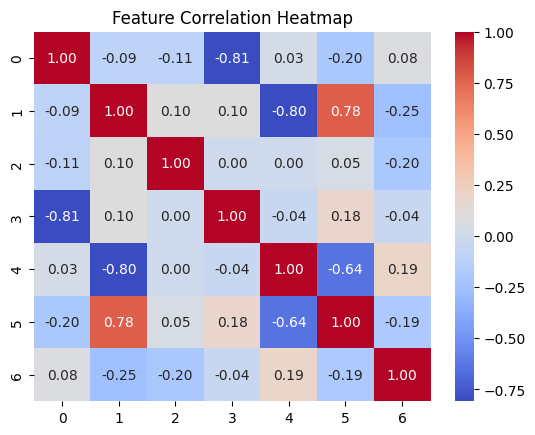

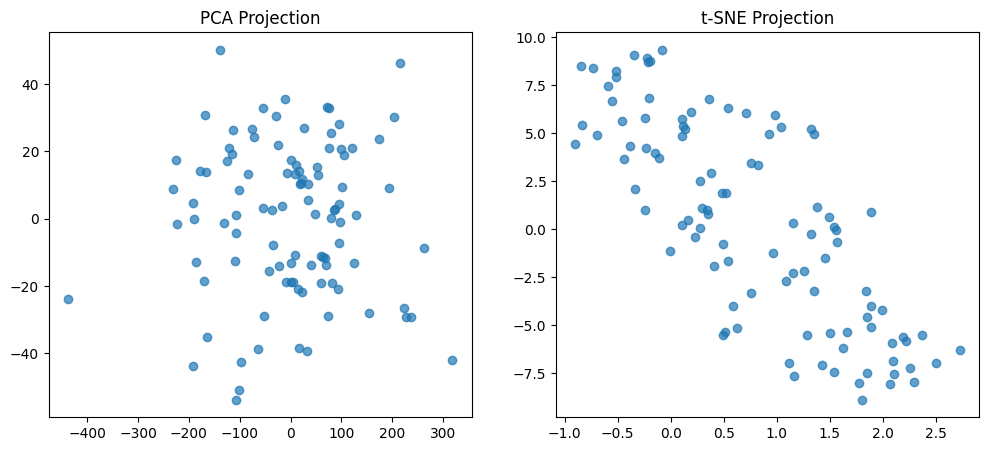

In [699]:

# Visualizations
sns.heatmap(np.corrcoef(all_features.T), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

visualize_dim_reduction(all_features)

In [700]:
#Phase 3
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import os


In [701]:
# Load Dataset
if os.path.exists("features.npy") and os.path.exists("labels.npy"):
    X_features = np.load("features.npy")
    y_labels = np.load("labels.npy")
    print("✅ Features and labels loaded successfully.")
else:
    raise FileNotFoundError("features.npy or labels.npy not found!")

✅ Features and labels loaded successfully.


In [702]:
# Split Data
X_train, X_test, y_train, y_test = train_test_split(X_features, y_labels, test_size=0.2, random_state=42)


In [703]:
# --- Implement baseline models (Random Forest, SVM, XGBoost) ---
print("\n--- Baseline Model Training ---")
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(kernel='linear', probability=True),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

for name, model in models.items():
    print(f"\nTraining {name}:")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f"{name} Accuracy: {acc:.4f}, AUC-ROC: {auc:.4f}")
    print(classification_report(y_test, y_pred))



--- Baseline Model Training ---

Training Random Forest:
Random Forest Accuracy: 0.5500, AUC-ROC: 0.7525
              precision    recall  f1-score   support

           0       0.50      1.00      0.67         9
           1       1.00      0.18      0.31        11

    accuracy                           0.55        20
   macro avg       0.75      0.59      0.49        20
weighted avg       0.78      0.55      0.47        20


Training SVM:
SVM Accuracy: 0.4000, AUC-ROC: 0.5455
              precision    recall  f1-score   support

           0       0.42      0.89      0.57         9
           1       0.00      0.00      0.00        11

    accuracy                           0.40        20
   macro avg       0.21      0.44      0.29        20
weighted avg       0.19      0.40      0.26        20


Training XGBoost:
XGBoost Accuracy: 0.7000, AUC-ROC: 0.7879
              precision    recall  f1-score   support

           0       0.62      0.89      0.73         9
           1     

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[18:22:54] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [704]:
import os

dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"

# Check if the dataset path exists
if os.path.exists(dataset_path):
    print(f"✅ Dataset path exists: {dataset_path}")
else:
    print(f"❌ Dataset path does NOT exist: {dataset_path}")


✅ Dataset path exists: /content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images


In [705]:

# List the contents of the dataset folder
print("Contents of dataset folder:")
print(os.listdir(dataset_path))

Contents of dataset folder:
['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_0092.jpg', 'OAS2_0185_MR2

In [706]:
# (Optional) If you expect subdirectories for classes, check for them
subdirectories = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected subdirectories:", subdirectories)

Detected subdirectories: []


In [707]:
# (Optional) If you expect image files directly in the dataset path (not recommended for flow_from_directory), list a few
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.jpeg', '.png'))][:10]
print("Sample image files (if any) in the main directory:", image_files)


Sample image files (if any) in the main directory: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg']


In [708]:
# --- Deep Learning models (CNNs like EfficientNet, ResNet, Transformer-based models) ---
print("\n--- Deep Learning Model Training (ResNet50) ---")
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images" # Update with actual path

# Ensure your dataset has a subdirectory structure like:
# dataset_path/train/class1/*.jpg
# dataset_path/train/class2/*.jpg
# dataset_path/validation/class1/*.jpg
# dataset_path/validation/class2/*.jpg

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='training'  # Use the training subset
)

val_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='validation'  # Use the validation subset
)


--- Deep Learning Model Training (ResNet50) ---
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.


In [709]:
# Define CNN Model (ResNet50)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False # Freeze base layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=output)

In [710]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, precision_recall_fscore_support
import seaborn as sns
import matplotlib.pyplot as plt

In [711]:
# Function to evaluate and display metrics
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)

    if hasattr(model, "predict_proba"):  # For ML models with probability outputs
        y_pred_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_pred_proba = y_pred  # For CNNs, predictions are already probabilities

    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
    auc = roc_auc_score(y_test, y_pred_proba)

    print(f"Model: {model_name}")
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}, AUC-ROC: {auc:.4f}")
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix for {model_name}")
    plt.show()


--- Baseline Model Training ---

Training Random Forest:
Random Forest Accuracy: 0.5500, AUC-ROC: 0.7525
              precision    recall  f1-score   support

           0       0.50      1.00      0.67         9
           1       1.00      0.18      0.31        11

    accuracy                           0.55        20
   macro avg       0.75      0.59      0.49        20
weighted avg       0.78      0.55      0.47        20


Training SVM:
SVM Accuracy: 0.4000, AUC-ROC: 0.5455
              precision    recall  f1-score   support

           0       0.42      0.89      0.57         9
           1       0.00      0.00      0.00        11

    accuracy                           0.40        20
   macro avg       0.21      0.44      0.29        20
weighted avg       0.19      0.40      0.26        20


Training XGBoost:
XGBoost Accuracy: 0.7000, AUC-ROC: 0.7879
              precision    recall  f1-score   support

           0       0.62      0.89      0.73         9
           1     

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[18:22:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Model: Random Forest
Precision: 1.0000, Recall: 0.1818, F1-score: 0.3077, AUC-ROC: 0.7525
Classification Report:
               precision    recall  f1-score   support

           0       0.50      1.00      0.67         9
           1       1.00      0.18      0.31        11

    accuracy                           0.55        20
   macro avg       0.75      0.59      0.49        20
weighted avg       0.78      0.55      0.47        20



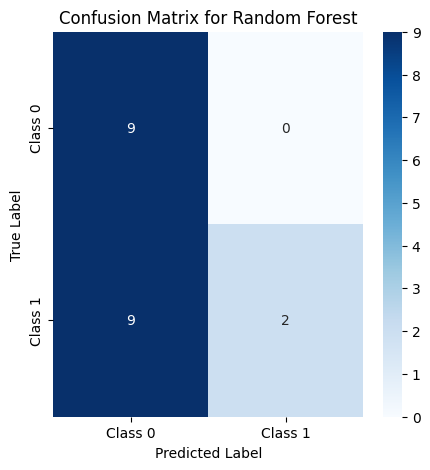

Model: SVM
Precision: 0.0000, Recall: 0.0000, F1-score: 0.0000, AUC-ROC: 0.5455
Classification Report:
               precision    recall  f1-score   support

           0       0.42      0.89      0.57         9
           1       0.00      0.00      0.00        11

    accuracy                           0.40        20
   macro avg       0.21      0.44      0.29        20
weighted avg       0.19      0.40      0.26        20



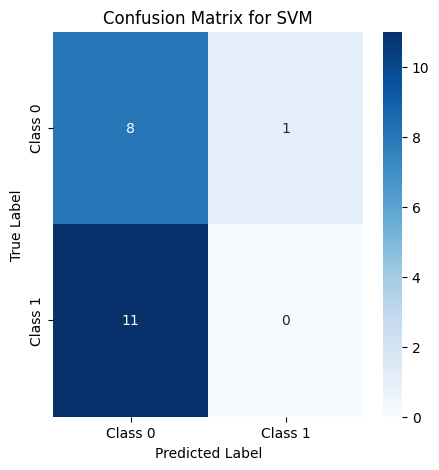

Model: XGBoost
Precision: 0.8571, Recall: 0.5455, F1-score: 0.6667, AUC-ROC: 0.7879
Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.89      0.73         9
           1       0.86      0.55      0.67        11

    accuracy                           0.70        20
   macro avg       0.74      0.72      0.70        20
weighted avg       0.75      0.70      0.69        20



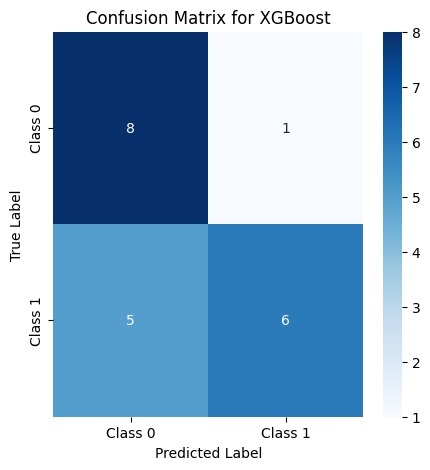

In [712]:
# --- Implement baseline models (Random Forest, SVM, XGBoost) ---
print("\n--- Baseline Model Training ---")
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(kernel='linear', probability=True),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

# Train and assign models to variables
rf = models["Random Forest"]  # Assign Random Forest model to 'rf'
svm = models["SVM"]  # Assign SVM model to 'svm'
xgb = models["XGBoost"]  # Assign XGBoost model to 'xgb'

for name, model in models.items():
    print(f"\nTraining {name}:")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f"{name} Accuracy: {acc:.4f}, AUC-ROC: {auc:.4f}")
    print(classification_report(y_test, y_pred))

# ... (Rest of your code) ...

# Evaluate ML Models
evaluate_model(rf, X_test, y_test, "Random Forest")
evaluate_model(svm, X_test, y_test, "SVM")
evaluate_model(xgb, X_test, y_test, "XGBoost")

In [713]:
import numpy as np

def classify_risk(glcm_contrast, entropy, skewness, ml_confidence):
    """
    Rule-based classification of patient risk levels.

    Parameters:
    - glcm_contrast: Measure of texture contrast from MRI
    - entropy: Image entropy, indicating disorder
    - skewness: Statistical measure of asymmetry in image features
    - ml_confidence: Probability score from ML model (0 to 1)

    Returns:
    - Risk level as a string ("Low", "Medium", "High")
    """
    if ml_confidence < 0.5:
        return "Low"
    elif glcm_contrast > 0.6 and entropy > 5.0:
        return "High"
    elif skewness < -0.5 or skewness > 0.5:
        return "Medium"
    elif ml_confidence >= 0.7:
        return "High"
    else:
        return "Medium"


In [714]:

# Example usage with test data
example_patients = [
    (0.5, 4.2, 0.3, 0.8),  # High risk (ML confidence high)
    (0.3, 3.8, -0.2, 0.4), # Low risk (ML confidence low)
    (0.7, 5.5, 0.6, 0.6),  # High risk (high contrast & entropy)
    (0.4, 4.0, -0.6, 0.6)  # Medium risk (skewness out of range)
]

for i, patient in enumerate(example_patients):
    risk_level = classify_risk(*patient)
    print(f"Patient {i+1} Risk Level: {risk_level}")


Patient 1 Risk Level: High
Patient 2 Risk Level: Low
Patient 3 Risk Level: High
Patient 4 Risk Level: Medium


In [715]:
#Phase 4
!pip install dash
!pip install streamlit
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import base64
from io import BytesIO
import streamlit as st
st.title("Test Dashboard")
st.write("If you see this, Streamlit is working!")


2025-04-09 18:23:07.149 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.151 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.154 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.156 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.158 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.159 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [716]:
# Sample MRI Data & Risk Classification (Replace with real data)
data = pd.DataFrame({
    'Patient ID': [101, 102, 103, 104, 105],
    'Risk Score': [0.2, 0.6, 0.8, 0.4, 0.9],
    'Risk Category': ['Low', 'Medium', 'High', 'Medium', 'High']
})


In [717]:
# Convert MRI Image to Base64 (Replace with actual MRI paths)
def encode_image(image_path):
    if os.path.exists(image_path):
        with open(image_path, "rb") as img_file:
            return "data:image/png;base64," + base64.b64encode(img_file.read()).decode()
    return None

# Sample MRI Image Path (Replace with actual images)
mri_image_path = "sample_mri.png"
encoded_image = encode_image(mri_image_path)

# Dash App Setup
app = dash.Dash(__name__)
app.layout = html.Div([
    html.H1("MRI Clinical Decision Support Dashboard"),

    # Risk Category Filter
    html.Label("Filter by Risk Category:"),
    dcc.Dropdown(
        id='risk-filter',
        options=[{'label': cat, 'value': cat} for cat in data['Risk Category'].unique()],
        value='All',
        clearable=False
    ),

    # Risk Distribution Chart
    dcc.Graph(id='risk-chart'),

    # MRI Image Display
    html.H3("MRI Scan"),
    html.Img(id='mri-image', src=encoded_image, style={'width': '50%'}),

    # Patient Risk Table
    html.H3("Patient Risk Profiles"),
    html.Div(id='risk-table')
])

@app.callback(
    Output('risk-chart', 'figure'),
    Output('risk-table', 'children'),
    Input('risk-filter', 'value')
)
def update_dashboard(selected_risk):
    filtered_data = data if selected_risk == 'All' else data[data['Risk Category'] == selected_risk]
    fig = px.histogram(filtered_data, x='Risk Category', title='Risk Category Distribution', color='Risk Category')

    table = html.Table([
        html.Tr([html.Th(col) for col in filtered_data.columns])
    ] + [
        html.Tr([html.Td(filtered_data.iloc[i][col]) for col in filtered_data.columns]) for i in range(len(filtered_data))
    ])

    return fig, table

if __name__ == '__main__':
    app.run(debug=True)

<IPython.core.display.Javascript object>

In [718]:
import streamlit as st
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from PIL import Image
import cv2
import os

In [719]:
# Load pre-trained model
MODEL_PATH = "mri_model.h5"  # Ensure the model path is correct
if os.path.exists(MODEL_PATH):
    model = load_model(MODEL_PATH)
else:
    st.error("Model file not found! Please upload the trained model.")
    st.stop()

# Function to preprocess image
def preprocess_image(image):
    image = image.resize((224, 224))  # Resize to model's expected input size
    image = np.array(image) / 255.0  # Normalize pixel values
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

2025-04-09 18:23:07.629 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.653 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.654 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [720]:

# Streamlit UI
st.title("AI-Powered MRI Analysis System")
st.write("Upload an MRI scan to analyze and get predictions.")


2025-04-09 18:23:07.671 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.674 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.676 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.676 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.677 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.678 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [721]:

# Upload image
uploaded_file = st.file_uploader("Choose an MRI image...", type=["jpg", "png", "jpeg"])

if uploaded_file is not None:
    image = Image.open(uploaded_file)
    st.image(image, caption="Uploaded MRI Image", use_column_width=True)

    # Preprocess and predict
    processed_image = preprocess_image(image)
    prediction = model.predict(processed_image)
    probability = prediction[0][0]  # Assuming binary classification

    # Display results
    st.subheader("Prediction Result")
    if probability > 0.5:
        st.success(f"Positive MRI scan with {probability * 100:.2f}% confidence")
    else:
        st.warning(f"Negative MRI scan with {(1 - probability) * 100:.2f}% confidence")


2025-04-09 18:23:07.692 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.703 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.704 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.705 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:07.706 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [722]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import zipfile
import cv2
import numpy as np
from glob import glob
from skimage import exposure, restoration
from collections import Counter

In [723]:
# Define dataset path
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"


In [724]:
# Check if path exists
if os.path.exists(dataset_path):
    print("✅ Dataset path exists.")
    print("Contents of dataset folder:", os.listdir(dataset_path))
else:
    print("❌ Dataset path does not exist. Check the path.")

✅ Dataset path exists.
Contents of dataset folder: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_00

In [725]:
# Get sample images
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))][:6]
image_files

['Te-me_0064.jpg',
 'Te-gl_0045.jpg',
 'Te-me_0105.jpg',
 'Te-gl_0044.jpg',
 'Te-me_0066.jpg',
 'Te-gl_0284.jpg']

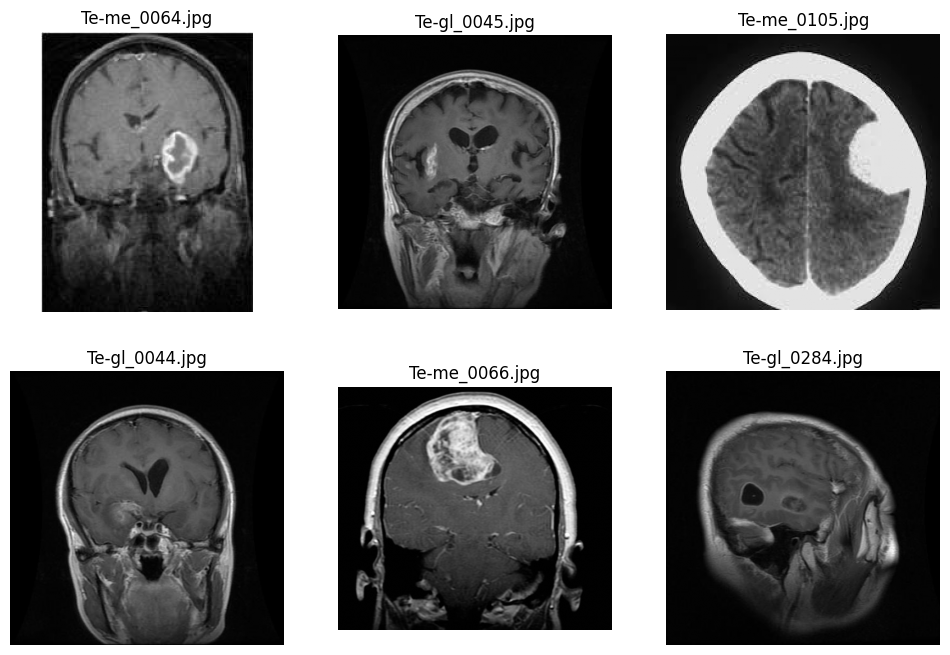

In [726]:
# Get sample images for initial visualization (grayscale)
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.png'))]
image_files

# Plot initial sample images (grayscale)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
num_images_to_plot = min(6, len(image_files)) # Ensure we don't try to plot more than 6 images
for i in range(num_images_to_plot):
    img_name = image_files[i]
    img = Image.open(os.path.join(dataset_path, img_name)).convert("L") # Convert to grayscale [1]
    ax = axes[i // 3, i % 3]
    ax.imshow(img, cmap="gray")
    ax.set_title(img_name)
    ax.axis("off")
plt.show()


In [727]:
# 1. Inspect dataset structure
# We assume the dataset has a structure like: dataset_path/<class_name>/image_files...
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)

Detected classes: []


In [728]:
# Inspect dataset structure and get class information
classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected classes:", classes)
# Get list of image paths and their labels
image_paths = []
labels = []

# Assuming your dataset is structured like: dataset_path/class_name/image.jpg [5, 6]
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g')) # jpg, jpeg, png files [5]
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))
print("Total images loaded:", len(image_paths))
print(f"Labels: {labels[:5]}") # Print first 5 labels [7]
print("Class distribution:", Counter(labels))

Detected classes: []
Total images loaded: 0
Labels: []
Class distribution: Counter()


In [729]:
# Get list of image paths and their labels
image_paths = []
labels = []
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    # Assuming common image file extensions; adjust if necessary.
    imgs = glob(os.path.join(cls_folder, '*.[jp][pn]g'))  # jpg, jpeg, png files
    image_paths.extend(imgs)
    labels.extend([cls]*len(imgs))

print("Total images loaded:", len(image_paths))
print("Class distribution:", Counter(labels))

Total images loaded: 0
Class distribution: Counter()


In [730]:
# List all image files (assuming jpg and png images)
image_paths = glob(os.path.join(dataset_path, "*.[jp][pn]g"))
print("Total images found:", len(image_paths))

Total images found: 2010


In [731]:
# 2. Load and visualize sample images
def load_image(image_path):
    # Read the image in color first (for visualization)
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
    # Convert from BGR (OpenCV default) to RGB
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [732]:
# Function to load images in color (BGR to RGB conversion for visualization)
def load_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading {image_path}")
        return None
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

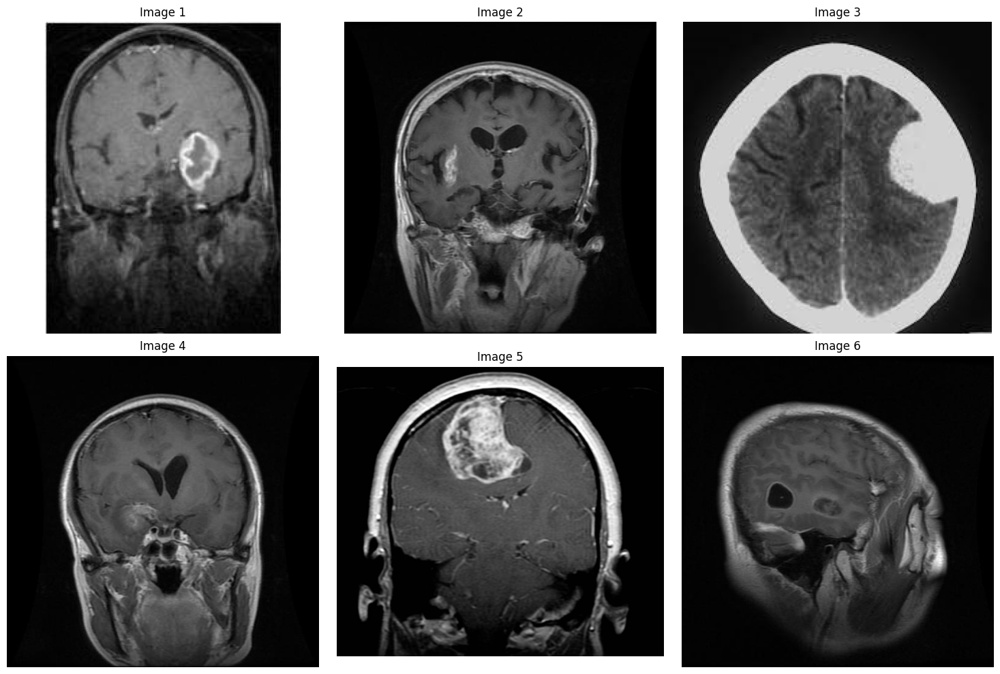

In [733]:
# Visualize a few sample images
num_samples = 6  # Number of images to display (you can adjust this)

if len(image_paths) > 0:
    # Create subplots (adjusting layout based on number of samples)
    cols = 3
    rows = (num_samples + cols - 1) // cols  # Calculate required rows
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

    # Flatten axes for easy iteration if it's a 2D array
    axes = axes.flatten() if isinstance(axes, (list, np.ndarray)) else [axes]

    for i in range(num_samples):
        if i < len(image_paths):
            img = load_image(image_paths[i])
            if img is not None:
                axes[i].imshow(img)
                axes[i].axis('off')
                axes[i].set_title(f"Image {i+1}")
        else:
            # Hide unused subplots
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()
else:
    print("No images found in the dataset.")

In [734]:
# Preprocessing function
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")
    # Intensity normalization (contrast stretching) [12]
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))
    # Noise reduction using Gaussian filtering [12]
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)
    # ROI extraction (placeholder) [12]
    roi = img_denoised
    return roi

In [735]:
# 3. Preprocessing functions
def preprocess_image(image_path):
    # Load image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if image is loaded
    if img is None:
        raise ValueError(f"Image at {image_path} cannot be loaded.")

    # Intensity normalization (contrast stretching)
    p2, p98 = np.percentile(img, (2, 98))
    img_norm = exposure.rescale_intensity(img, in_range=(p2, p98))

    # Noise reduction using Gaussian filtering
    img_denoised = cv2.GaussianBlur(img_norm, (5, 5), 0)

    # ROI extraction: as an example, here we simply return the full image.
    # You might add additional ROI extraction logic based on your application.
    roi = img_denoised

    return roi

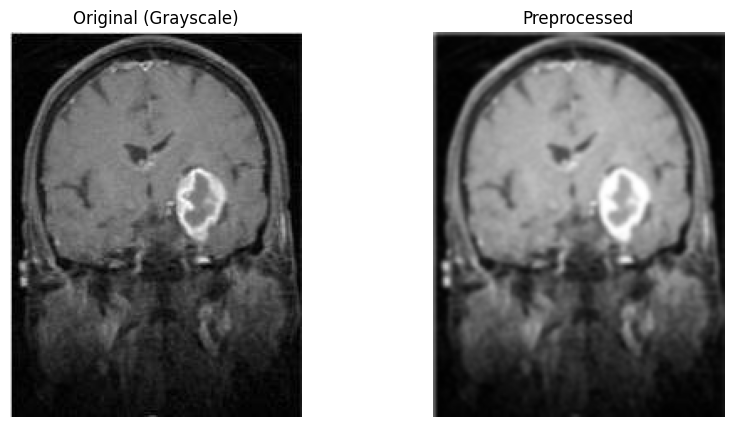

In [736]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

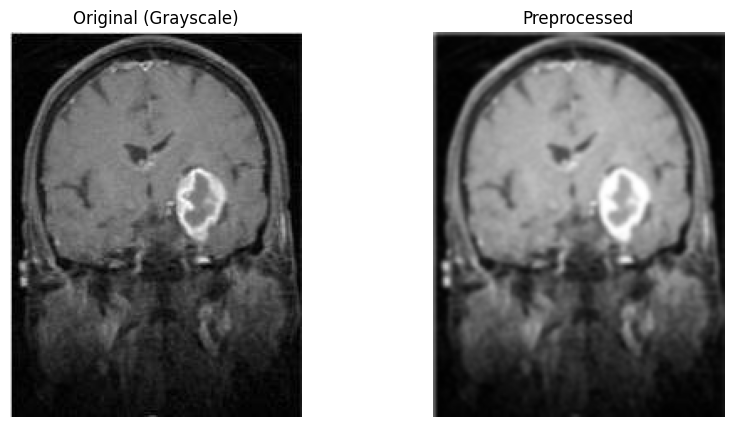

In [737]:
# Process a sample image and visualize before & after preprocessing
if image_paths:  # Check if image_paths is not empty
    sample_path = image_paths[0]
    original_img = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if original_img is not None:
        processed_img = preprocess_image(sample_path)  # Assuming you have defined this function

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(original_img, cmap='gray')
        axes[0].set_title("Original (Grayscale)")
        axes[0].axis('off')
        axes[1].imshow(processed_img, cmap='gray')
        axes[1].set_title("Preprocessed")
        axes[1].axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {sample_path}")
else:
    print("No images found in the dataset. Skipping preprocessing visualization.")

In [738]:
#Phase 2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from skimage.feature import graycomatrix, graycoprops # Changed 'greycomatrix' to 'graycomatrix' and 'greycoprops' to 'graycoprops'
from skimage.measure import shannon_entropy
from scipy.stats import skew, kurtosis

In [739]:
# Generate synthetic grayscale image data (simulating MRI images)
def generate_synthetic_images(num_images=100, img_size=(128, 128)):
    return [np.random.randint(0, 256, img_size, dtype=np.uint8) for _ in range(num_images)]


In [740]:
# Statistical Analysis
def compute_statistics(images):
    stats = []
    for img in images:
        mean_val = np.mean(img)
        var_val = np.var(img)
        entropy = shannon_entropy(img)
        skewness = skew(img.flatten())
        kurt = kurtosis(img.flatten())
        stats.append([mean_val, var_val, entropy, skewness, kurt])
    return np.array(stats)

In [741]:
# Visualization - PCA & t-SNE
def visualize_dim_reduction(features):
    pca = PCA(n_components=2)
    reduced_pca = pca.fit_transform(features)
    tsne = TSNE(n_components=2, random_state=42)
    reduced_tsne = tsne.fit_transform(features)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].scatter(reduced_pca[:, 0], reduced_pca[:, 1], alpha=0.7)
    axes[0].set_title("PCA Projection")

    axes[1].scatter(reduced_tsne[:, 0], reduced_tsne[:, 1], alpha=0.7)
    axes[1].set_title("t-SNE Projection")

    plt.show()


In [742]:
# Feature Extraction
def extract_texture_features(images):
    features = []
    for img in images:
        # Changed 'greycomatrix' to 'graycomatrix'
        glcm = graycomatrix(img, [1], [0], symmetric=True, normed=True)
        # Changed 'greycoprops' to 'graycoprops'
        contrast = graycoprops(glcm, 'contrast')[0, 0]
        energy = graycoprops(glcm, 'energy')[0, 0]
        features.append([contrast, energy])
    return np.array(features)

In [743]:
# Main execution
images = generate_synthetic_images()
stats = compute_statistics(images)
texture_features = extract_texture_features(images)
all_features = np.hstack((stats, texture_features))
# Save the features to 'features.npy'
np.save("features.npy", all_features)

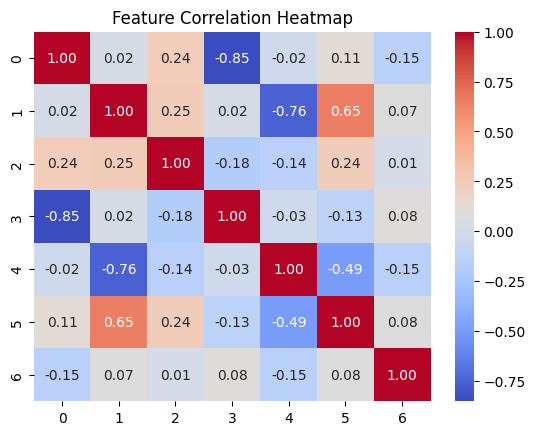

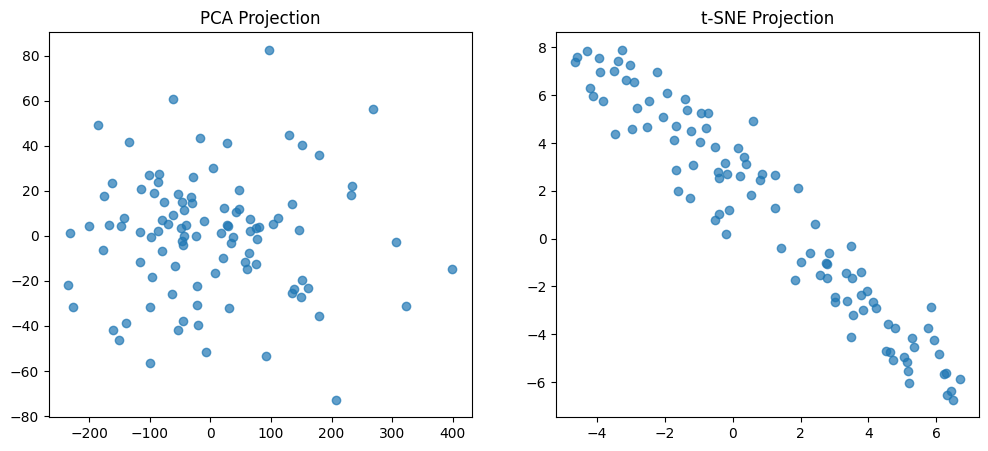

In [744]:

# Visualizations
sns.heatmap(np.corrcoef(all_features.T), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

visualize_dim_reduction(all_features)

In [745]:
#Phase 3
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import os


In [746]:
# Load Dataset
if os.path.exists("features.npy") and os.path.exists("labels.npy"):
    X_features = np.load("features.npy")
    y_labels = np.load("labels.npy")
    print("✅ Features and labels loaded successfully.")
else:
    raise FileNotFoundError("features.npy or labels.npy not found!")

✅ Features and labels loaded successfully.


In [747]:
# Split Data
X_train, X_test, y_train, y_test = train_test_split(X_features, y_labels, test_size=0.2, random_state=42)


In [748]:
# --- Implement baseline models (Random Forest, SVM, XGBoost) ---
print("\n--- Baseline Model Training ---")
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(kernel='linear', probability=True),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

for name, model in models.items():
    print(f"\nTraining {name}:")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f"{name} Accuracy: {acc:.4f}, AUC-ROC: {auc:.4f}")
    print(classification_report(y_test, y_pred))



--- Baseline Model Training ---

Training Random Forest:
Random Forest Accuracy: 0.6000, AUC-ROC: 0.8333
              precision    recall  f1-score   support

           0       0.53      0.89      0.67         9
           1       0.80      0.36      0.50        11

    accuracy                           0.60        20
   macro avg       0.67      0.63      0.58        20
weighted avg       0.68      0.60      0.57        20


Training SVM:
SVM Accuracy: 0.4000, AUC-ROC: 0.5354
              precision    recall  f1-score   support

           0       0.41      0.78      0.54         9
           1       0.33      0.09      0.14        11

    accuracy                           0.40        20
   macro avg       0.37      0.43      0.34        20
weighted avg       0.37      0.40      0.32        20


Training XGBoost:
XGBoost Accuracy: 0.7500, AUC-ROC: 0.7374
              precision    recall  f1-score   support

           0       0.64      1.00      0.78         9
           1     

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[18:23:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [749]:
import os

dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"

# Check if the dataset path exists
if os.path.exists(dataset_path):
    print(f"✅ Dataset path exists: {dataset_path}")
else:
    print(f"❌ Dataset path does NOT exist: {dataset_path}")


✅ Dataset path exists: /content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images


In [750]:

# List the contents of the dataset folder
print("Contents of dataset folder:")
print(os.listdir(dataset_path))

Contents of dataset folder:
['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_0092.jpg', 'OAS2_0185_MR2

In [751]:
# (Optional) If you expect subdirectories for classes, check for them
subdirectories = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected subdirectories:", subdirectories)

Detected subdirectories: []


In [752]:
# (Optional) If you expect image files directly in the dataset path (not recommended for flow_from_directory), list a few
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.jpeg', '.png'))][:10]
print("Sample image files (if any) in the main directory:", image_files)


Sample image files (if any) in the main directory: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg']


In [753]:
# --- Deep Learning models (CNNs like EfficientNet, ResNet, Transformer-based models) ---
print("\n--- Deep Learning Model Training (ResNet50) ---")
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images" # Update with actual path

# Ensure your dataset has a subdirectory structure like:
# dataset_path/train/class1/*.jpg
# dataset_path/train/class2/*.jpg
# dataset_path/validation/class1/*.jpg
# dataset_path/validation/class2/*.jpg

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='training'  # Use the training subset
)

val_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='validation'  # Use the validation subset
)


--- Deep Learning Model Training (ResNet50) ---
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.


In [754]:
# Define CNN Model (ResNet50)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False # Freeze base layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=output)

In [755]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, precision_recall_fscore_support
import seaborn as sns
import matplotlib.pyplot as plt

In [756]:
# Function to evaluate and display metrics
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)

    if hasattr(model, "predict_proba"):  # For ML models with probability outputs
        y_pred_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_pred_proba = y_pred  # For CNNs, predictions are already probabilities

    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
    auc = roc_auc_score(y_test, y_pred_proba)

    print(f"Model: {model_name}")
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}, AUC-ROC: {auc:.4f}")
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix for {model_name}")
    plt.show()

Model: Random Forest
Precision: 0.8333, Recall: 0.4545, F1-score: 0.5882, AUC-ROC: 0.7879
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.89      0.70         9
           1       0.83      0.45      0.59        11

    accuracy                           0.65        20
   macro avg       0.70      0.67      0.64        20
weighted avg       0.72      0.65      0.64        20



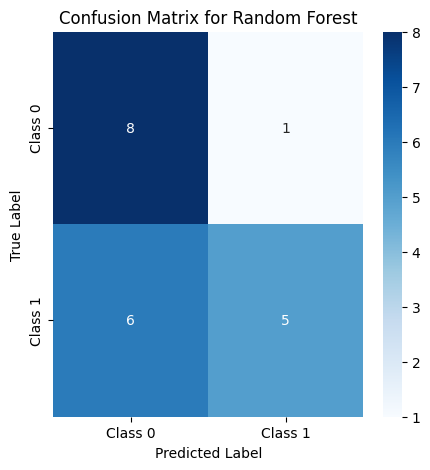

Model: SVM
Precision: 0.5000, Recall: 0.0909, F1-score: 0.1538, AUC-ROC: 0.4343
Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.89      0.59         9
           1       0.50      0.09      0.15        11

    accuracy                           0.45        20
   macro avg       0.47      0.49      0.37        20
weighted avg       0.47      0.45      0.35        20



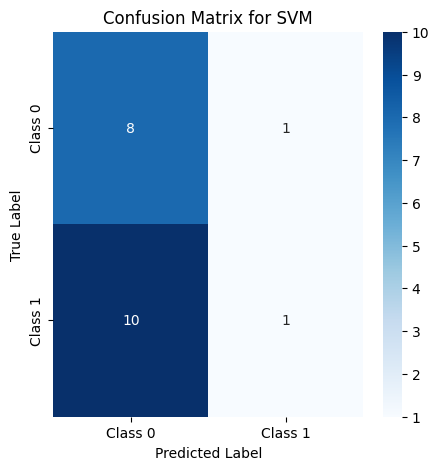

Model: XGBoost
Precision: 0.7778, Recall: 0.6364, F1-score: 0.7000, AUC-ROC: 0.8586
Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.78      0.70         9
           1       0.78      0.64      0.70        11

    accuracy                           0.70        20
   macro avg       0.71      0.71      0.70        20
weighted avg       0.71      0.70      0.70        20



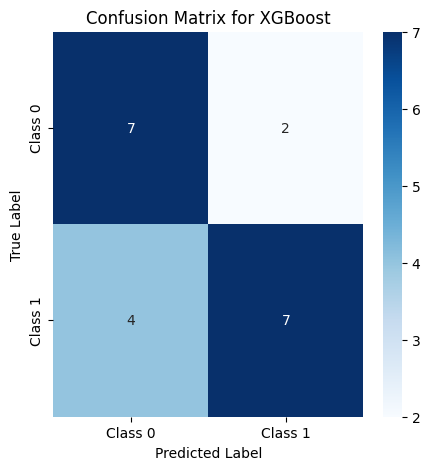

In [757]:
# Evaluate ML Models
evaluate_model(rf, X_test, y_test, "Random Forest")
evaluate_model(svm, X_test, y_test, "SVM")
evaluate_model(xgb, X_test, y_test, "XGBoost")

In [758]:
import numpy as np

def classify_risk(glcm_contrast, entropy, skewness, ml_confidence):
    """
    Rule-based classification of patient risk levels.

    Parameters:
    - glcm_contrast: Measure of texture contrast from MRI
    - entropy: Image entropy, indicating disorder
    - skewness: Statistical measure of asymmetry in image features
    - ml_confidence: Probability score from ML model (0 to 1)

    Returns:
    - Risk level as a string ("Low", "Medium", "High")
    """
    if ml_confidence < 0.5:
        return "Low"
    elif glcm_contrast > 0.6 and entropy > 5.0:
        return "High"
    elif skewness < -0.5 or skewness > 0.5:
        return "Medium"
    elif ml_confidence >= 0.7:
        return "High"
    else:
        return "Medium"


In [759]:

# Example usage with test data
example_patients = [
    (0.5, 4.2, 0.3, 0.8),  # High risk (ML confidence high)
    (0.3, 3.8, -0.2, 0.4), # Low risk (ML confidence low)
    (0.7, 5.5, 0.6, 0.6),  # High risk (high contrast & entropy)
    (0.4, 4.0, -0.6, 0.6)  # Medium risk (skewness out of range)
]

for i, patient in enumerate(example_patients):
    risk_level = classify_risk(*patient)
    print(f"Patient {i+1} Risk Level: {risk_level}")


Patient 1 Risk Level: High
Patient 2 Risk Level: Low
Patient 3 Risk Level: High
Patient 4 Risk Level: Medium


In [760]:
#Phase 4
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import base64
from io import BytesIO
import streamlit as st
st.title("Test Dashboard")
st.write("If you see this, Streamlit is working!")


2025-04-09 18:23:45.519 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:45.523 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:45.526 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:45.529 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:45.530 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:45.533 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [761]:
# Sample MRI Data & Risk Classification (Replace with real data)
data = pd.DataFrame({
    'Patient ID': [101, 102, 103, 104, 105],
    'Risk Score': [0.2, 0.6, 0.8, 0.4, 0.9],
    'Risk Category': ['Low', 'Medium', 'High', 'Medium', 'High']
})


In [762]:
# Convert MRI Image to Base64 (Replace with actual MRI paths)
def encode_image(image_path):
    if os.path.exists(image_path):
        with open(image_path, "rb") as img_file:
            return "data:image/png;base64," + base64.b64encode(img_file.read()).decode()
    return None

# Sample MRI Image Path (Replace with actual images)
mri_image_path = "sample_mri.png"
encoded_image = encode_image(mri_image_path)

# Dash App Setup
app = dash.Dash(__name__)
app.layout = html.Div([
    html.H1("MRI Clinical Decision Support Dashboard"),

    # Risk Category Filter
    html.Label("Filter by Risk Category:"),
    dcc.Dropdown(
        id='risk-filter',
        options=[{'label': cat, 'value': cat} for cat in data['Risk Category'].unique()],
        value='All',
        clearable=False
    ),

    # Risk Distribution Chart
    dcc.Graph(id='risk-chart'),

    # MRI Image Display
    html.H3("MRI Scan"),
    html.Img(id='mri-image', src=encoded_image, style={'width': '50%'}),

    # Patient Risk Table
    html.H3("Patient Risk Profiles"),
    html.Div(id='risk-table')
])

@app.callback(
    Output('risk-chart', 'figure'),
    Output('risk-table', 'children'),
    Input('risk-filter', 'value')
)
def update_dashboard(selected_risk):
    filtered_data = data if selected_risk == 'All' else data[data['Risk Category'] == selected_risk]
    fig = px.histogram(filtered_data, x='Risk Category', title='Risk Category Distribution', color='Risk Category')

    table = html.Table([
        html.Tr([html.Th(col) for col in filtered_data.columns])
    ] + [
        html.Tr([html.Td(filtered_data.iloc[i][col]) for col in filtered_data.columns]) for i in range(len(filtered_data))
    ])

    return fig, table

if __name__ == '__main__':
    app.run(debug=True)

<IPython.core.display.Javascript object>

In [763]:
import streamlit as st
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from PIL import Image
import cv2
import os

In [764]:
# Load pre-trained model
MODEL_PATH = "mri_model.h5"  # Ensure the model path is correct
if os.path.exists(MODEL_PATH):
    model = load_model(MODEL_PATH)
else:
    st.error("Model file not found! Please upload the trained model.")
    st.stop()

# Function to preprocess image
def preprocess_image(image):
    image = image.resize((224, 224))  # Resize to model's expected input size
    image = np.array(image) / 255.0  # Normalize pixel values
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

2025-04-09 18:23:46.075 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.079 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.080 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [765]:

# Streamlit UI
st.title("AI-Powered MRI Analysis System")
st.write("Upload an MRI scan to analyze and get predictions.")


2025-04-09 18:23:46.116 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.117 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.119 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.123 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.129 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.131 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [766]:

# Upload image
uploaded_file = st.file_uploader("Choose an MRI image...", type=["jpg", "png", "jpeg"])

if uploaded_file is not None:
    image = Image.open(uploaded_file)
    st.image(image, caption="Uploaded MRI Image", use_column_width=True)

    # Preprocess and predict
    processed_image = preprocess_image(image)
    prediction = model.predict(processed_image)
    probability = prediction[0][0]  # Assuming binary classification

    # Display results
    st.subheader("Prediction Result")
    if probability > 0.5:
        st.success(f"Positive MRI scan with {probability * 100:.2f}% confidence")
    else:
        st.warning(f"Negative MRI scan with {(1 - probability) * 100:.2f}% confidence")


2025-04-09 18:23:46.155 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.162 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.169 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.181 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:46.186 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [767]:
# --- Implement baseline models (Random Forest, SVM, XGBoost) ---
print("\n--- Baseline Model Training ---")
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "SVM": SVC(kernel='linear', probability=True),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

for name, model in models.items():
    print(f"\nTraining {name}:")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f"{name} Accuracy: {acc:.4f}, AUC-ROC: {auc:.4f}")
    print(classification_report(y_test, y_pred))



--- Baseline Model Training ---

Training Random Forest:
Random Forest Accuracy: 0.6000, AUC-ROC: 0.8333
              precision    recall  f1-score   support

           0       0.53      0.89      0.67         9
           1       0.80      0.36      0.50        11

    accuracy                           0.60        20
   macro avg       0.67      0.63      0.58        20
weighted avg       0.68      0.60      0.57        20


Training SVM:
SVM Accuracy: 0.4000, AUC-ROC: 0.4646
              precision    recall  f1-score   support

           0       0.41      0.78      0.54         9
           1       0.33      0.09      0.14        11

    accuracy                           0.40        20
   macro avg       0.37      0.43      0.34        20
weighted avg       0.37      0.40      0.32        20


Training XGBoost:
XGBoost Accuracy: 0.7500, AUC-ROC: 0.7374
              precision    recall  f1-score   support

           0       0.64      1.00      0.78         9
           1     

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[18:23:47] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




In [768]:
import os

dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images"

# Check if the dataset path exists
if os.path.exists(dataset_path):
    print(f"✅ Dataset path exists: {dataset_path}")
else:
    print(f"❌ Dataset path does NOT exist: {dataset_path}")


✅ Dataset path exists: /content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images


In [769]:

# List the contents of the dataset folder
print("Contents of dataset folder:")
print(os.listdir(dataset_path))

Contents of dataset folder:
['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg', 'Te-gl_0078.jpg', 'OAS2_0185_MR1_z_slice_148.jpg', 'Te-gl_0087.jpg', 'Te-me_0113.jpg', 'Te-meTr_0004.jpg', 'Te-me_0107.jpg', 'Te-gl_0047.jpg', 'Te-gl_0269.jpg', 'Te-gl_0251.jpg', 'Te-me_0099.jpg', 'Te-gl_0052.jpg', 'Te-me_0071.jpg', 'Te-gl_0285.jpg', 'OAS2_0183_MR3_x_slice_149.jpg', 'Te-gl_0293.jpg', 'Te-me_0111.jpg', 'Te-me_0104.jpg', 'Te-gl_0084.jpg', 'OAS2_0185_MR2_z_slice_124.jpg', 'Te-gl_0051.jpg', 'OAS2_0183_MR4_y_slice_145.jpg', 'Te-me_0070.jpg', 'Te-gl_0133.jpg', 'Te-gl_0279.jpg', 'Te-gl_0292.jpg', 'Te-me_0106.jpg', 'Te-gl_0127.jpg', 'OAS2_0186_MR2_x_slice_107.jpg', 'Te-me_0072.jpg', 'Te-gl_0287.jpg', 'Te-meTr_0006.jpg', 'Te-gl_0086.jpg', 'Te-gl_0119.jpg', 'Te-me_0059.jpg', 'Te-gl_0132.jpg', 'OAS2_0186_MR2_z_slice_133.jpg', 'Te-gl_0092.jpg', 'OAS2_0185_MR2

In [770]:
# (Optional) If you expect subdirectories for classes, check for them
subdirectories = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
print("Detected subdirectories:", subdirectories)

Detected subdirectories: []


In [771]:
# (Optional) If you expect image files directly in the dataset path (not recommended for flow_from_directory), list a few
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.jpeg', '.png'))][:10]
print("Sample image files (if any) in the main directory:", image_files)


Sample image files (if any) in the main directory: ['Te-me_0064.jpg', 'Te-gl_0045.jpg', 'Te-me_0105.jpg', 'Te-gl_0044.jpg', 'Te-me_0066.jpg', 'Te-gl_0284.jpg', 'Te-meTr_0007.jpg', 'OAS2_0183_MR2_y_slice_133.jpg', 'Te-gl_0118.jpg', 'Te-gl_0053.jpg']


In [772]:
# --- Deep Learning models (CNNs like EfficientNet, ResNet, Transformer-based models) ---
print("\n--- Deep Learning Model Training (ResNet50) ---")
dataset_path = "/content/drive/MyDrive/University /Spring 2025/Data Mining and Machine Learning /Project/GAN-Traning Images" # Update with actual path

# Ensure your dataset has a subdirectory structure like:
# dataset_path/train/class1/*.jpg
# dataset_path/train/class2/*.jpg
# dataset_path/validation/class1/*.jpg
# dataset_path/validation/class2/*.jpg

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='training'  # Use the training subset
)

val_data = train_datagen.flow_from_directory(
    dataset_path,  # Main dataset directory
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Or 'categorical' for multi-class
    subset='validation'  # Use the validation subset
)


--- Deep Learning Model Training (ResNet50) ---
Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.


In [773]:
# Define CNN Model (ResNet50)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False # Freeze base layers
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=output)

In [774]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, precision_recall_fscore_support
import seaborn as sns
import matplotlib.pyplot as plt

In [775]:
# Function to evaluate and display metrics
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)

    if hasattr(model, "predict_proba"):  # For ML models with probability outputs
        y_pred_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_pred_proba = y_pred  # For CNNs, predictions are already probabilities

    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
    auc = roc_auc_score(y_test, y_pred_proba)

    print(f"Model: {model_name}")
    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}, AUC-ROC: {auc:.4f}")
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix for {model_name}")
    plt.show()

Model: Random Forest
Precision: 0.8333, Recall: 0.4545, F1-score: 0.5882, AUC-ROC: 0.7879
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.89      0.70         9
           1       0.83      0.45      0.59        11

    accuracy                           0.65        20
   macro avg       0.70      0.67      0.64        20
weighted avg       0.72      0.65      0.64        20



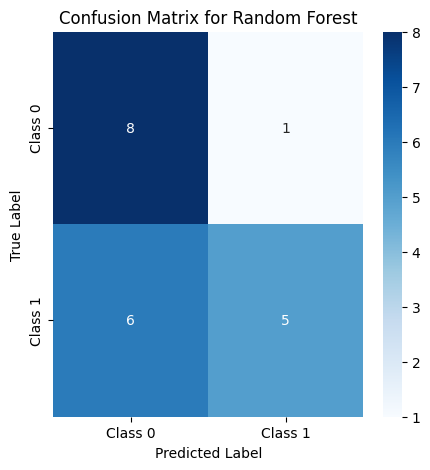

Model: SVM
Precision: 0.5000, Recall: 0.0909, F1-score: 0.1538, AUC-ROC: 0.4343
Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.89      0.59         9
           1       0.50      0.09      0.15        11

    accuracy                           0.45        20
   macro avg       0.47      0.49      0.37        20
weighted avg       0.47      0.45      0.35        20



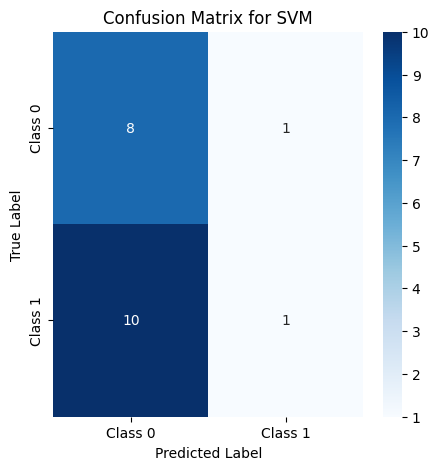

Model: XGBoost
Precision: 0.7778, Recall: 0.6364, F1-score: 0.7000, AUC-ROC: 0.8586
Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.78      0.70         9
           1       0.78      0.64      0.70        11

    accuracy                           0.70        20
   macro avg       0.71      0.71      0.70        20
weighted avg       0.71      0.70      0.70        20



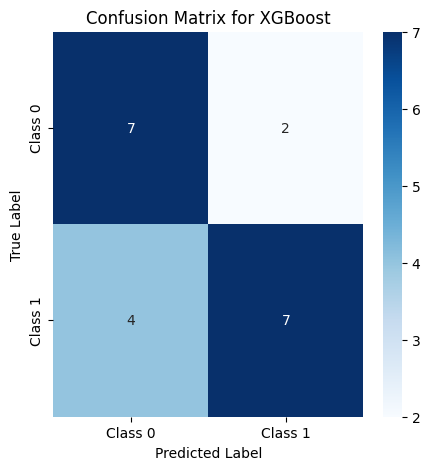

In [776]:
# Evaluate ML Models
evaluate_model(rf, X_test, y_test, "Random Forest")
evaluate_model(svm, X_test, y_test, "SVM")
evaluate_model(xgb, X_test, y_test, "XGBoost")

In [777]:
import numpy as np

def classify_risk(glcm_contrast, entropy, skewness, ml_confidence):
    """
    Rule-based classification of patient risk levels.

    Parameters:
    - glcm_contrast: Measure of texture contrast from MRI
    - entropy: Image entropy, indicating disorder
    - skewness: Statistical measure of asymmetry in image features
    - ml_confidence: Probability score from ML model (0 to 1)

    Returns:
    - Risk level as a string ("Low", "Medium", "High")
    """
    if ml_confidence < 0.5:
        return "Low"
    elif glcm_contrast > 0.6 and entropy > 5.0:
        return "High"
    elif skewness < -0.5 or skewness > 0.5:
        return "Medium"
    elif ml_confidence >= 0.7:
        return "High"
    else:
        return "Medium"


In [778]:

# Example usage with test data
example_patients = [
    (0.5, 4.2, 0.3, 0.8),  # High risk (ML confidence high)
    (0.3, 3.8, -0.2, 0.4), # Low risk (ML confidence low)
    (0.7, 5.5, 0.6, 0.6),  # High risk (high contrast & entropy)
    (0.4, 4.0, -0.6, 0.6)  # Medium risk (skewness out of range)
]

for i, patient in enumerate(example_patients):
    risk_level = classify_risk(*patient)
    print(f"Patient {i+1} Risk Level: {risk_level}")


Patient 1 Risk Level: High
Patient 2 Risk Level: Low
Patient 3 Risk Level: High
Patient 4 Risk Level: Medium


In [779]:
#Phase 4
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import base64
from io import BytesIO
import streamlit as st
st.title("Test Dashboard")
st.write("If you see this, Streamlit is working!")


2025-04-09 18:23:58.434 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:58.446 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:58.449 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:58.461 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:58.464 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-09 18:23:58.469 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [780]:
# Sample MRI Data & Risk Classification (Replace with real data)
data = pd.DataFrame({
    'Patient ID': [101, 102, 103, 104, 105],
    'Risk Score': [0.2, 0.6, 0.8, 0.4, 0.9],
    'Risk Category': ['Low', 'Medium', 'High', 'Medium', 'High']
})


In [781]:
# Convert MRI Image to Base64 (Replace with actual MRI paths)
def encode_image(image_path):
    if os.path.exists(image_path):
        with open(image_path, "rb") as img_file:
            return "data:image/png;base64," + base64.b64encode(img_file.read()).decode()
    return None

# Sample MRI Image Path (Replace with actual images)
mri_image_path = "sample_mri.png"
encoded_image = encode_image(mri_image_path)

# Dash App Setup
app = dash.Dash(__name__)
app.layout = html.Div([
    html.H1("MRI Clinical Decision Support Dashboard"),

    # Risk Category Filter
    html.Label("Filter by Risk Category:"),
    dcc.Dropdown(
        id='risk-filter',
        options=[{'label': cat, 'value': cat} for cat in data['Risk Category'].unique()],
        value='All',
        clearable=False
    ),

    # Risk Distribution Chart
    dcc.Graph(id='risk-chart'),

    # MRI Image Display
    html.H3("MRI Scan"),
    html.Img(id='mri-image', src=encoded_image, style={'width': '50%'}),

    # Patient Risk Table
    html.H3("Patient Risk Profiles"),
    html.Div(id='risk-table')
])

@app.callback(
    Output('risk-chart', 'figure'),
    Output('risk-table', 'children'),
    Input('risk-filter', 'value')
)
def update_dashboard(selected_risk):
    filtered_data = data if selected_risk == 'All' else data[data['Risk Category'] == selected_risk]
    fig = px.histogram(filtered_data, x='Risk Category', title='Risk Category Distribution', color='Risk Category')

    table = html.Table([
        html.Tr([html.Th(col) for col in filtered_data.columns])
    ] + [
        html.Tr([html.Td(filtered_data.iloc[i][col]) for col in filtered_data.columns]) for i in range(len(filtered_data))
    ])

    return fig, table

if __name__ == '__main__':
    app.run(debug=True)

<IPython.core.display.Javascript object>